# **Analysis of Ride Patterns and Fare Dynamics in New York City TLC Trips**

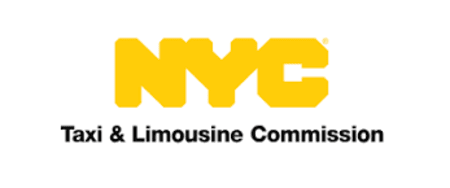



Team:
- Neha Shastri (Project Manager)
- Hyunjin Yu
- Raskirt Bhatia
- Glenn Castellino
- Yifeng Chen
- Quan Nguyen

## Table of Contents


---



---



*   [Executive Summary](#scrollTo=C8-zfZ3Ese1Y)
*   [Project Proposal](#scrollTo=VBfcOThObVUZ)
*   [Introduction & Motivation](#scrollTo=EsZRkhfaG5_q&line=1&uniqifier=1)
*  [ Data & Source](#scrollTo=gv8Qp4ZR4QYE)
*   [Data Manipulation & Cleaning](#scrollTo=fBl4Dl4exLqd)
* [  Exploratory Data Analysis ](#scrollTo=EupSAgcg97_D)
*  [ Conclusion](#scrollTo=VR7uGgRL7E3n&line=10&uniqifier=1)
* [ Challenges](#scrollTo=Nu0PeEBrvzio)
*  [ References](#scrollTo=c-VCVIelZSYq&line=1&uniqifier=1)
*  [ Generative AI Disclosure](#scrollTo=gA3gdeJ4YL3G&line=1&uniqifier=1)








##Executive Summary


---



---
This project analyzes ride patterns and fare dynamics for New York City's Taxi and Limousine Commission (TLC) trips, focusing on 2023 data for both yellow and green taxis. The objective is to identify key factors influencing taxi demand, pricing efficiency, and passenger behaviors. The analysis explores trip volumes, fare distribution, and pickup/drop-off patterns across different time periods and locations. Additionally, the project investigates fare elasticity in response to pricing changes, surcharge implementations, and external influences like weather conditions and holidays. The data was cleaned and processed to remove unrealistic records, categorize trips based on distance, and calculate various metrics like trip duration and fare per mile. Our findings offer recommendations for optimizing pricing strategies, improving customer satisfaction, and enhancing driver operations by targeting high-demand zones and times. This project serves as a comprehensive analysis of the factors driving NYC's taxi market, providing key insights for improving both customer experience and revenue generation for taxi operators.


## Project Proposal


---



---


Our goal is to analyze the trip patterns and fare dynamics of yellow and green taxis in New York City in 2023. This analysis will help identify key areas for service efficiency improvements and provide insights to optimize pricing strategies. Through a detailed exploratory data analysis and visualizations, we aim to:

- Explore customer behavior by assessing payment methods used, tip amounts, average fares for different trip lengths.
- Identify high-traffic pickup and drop-off zones, focusing on areas with the best pickup/drop-off ratios throughout the year.
- Evaluate fare and trip trends across NYC boroughs, examining the relationship between fare rates and trip volume.
- Identify peak fare collection periods by analyzing fare data by pickup hour.
- Compare pricing efficiency between yellow and green taxis by assessing fare and distance metrics.
- Investigate temporal trends to identify fluctuations in fare patterns and evaluate the impact of external factors on taxi usage.

By achieving these goals, we can deliver actionable insights to improve the service and pricing models of NYC's taxi system.







## Introduction and Motivation



---



---


Every day in New York City, thousands of passengers rely on taxis to navigate one of the busiest urban environments in the world. In a city where public transportation can often be unreliable or inconvenient, taxis offer a flexible alternative. Whether hailing a yellow taxi in Manhattan or using a green taxi in outer boroughs, New Yorkers seek convenience and efficiency in their journeys. However, despite their widespread use, there’s still much to uncover about rider behavior, pricing efficiency, and peak demand periods.

This project is motivated by a desire to provide data-driven insights that can enhance the efficiency of taxi services, improve pricing strategies, and ultimately make the overall passenger experience smoother and more cost-effective. By analyzing fare and trip trends, this project will not only inform future transportation policies but also help shape the future of urban mobility in NYC. With better service optimization, taxi systems can operate more sustainably and cater to the diverse needs of the city's residents and visitors.

## Data & Source

---
---
This dataset is collected by the NYC Taxi and Limousine Commission (TLC) and includes trip records from all trips completed in Yellow and Green taxis in NYC. Records include fields capturing pick-up and drop-off dates/times, pick-up and drop-off locations, trip distances, itemized fares, rate types, payment types, and driver-reported passenger counts.





### Data Source


---


NYC Taxi and Limousine Commission Official Page: https://www.nyc.gov/site/tlc/about/tlc-trip-record-data.page

Open-Meteo Weather API - https://open-meteo.com/

### Column Description


---
**NYC Taxi and Limousine Commission Data**


---




| Column | Description | Dtype | Variable Type |
|--------|-------------|-------|---------------|
|1. `PULocationID` | TLC Taxi Zone in which the taximeter was engaged | int64 | Categorical |
|2. `DOLocationID` | TLC Taxi Zone in which the taximeter was disengaged | int64 | Categorical |
|3. `passenger_count` | The number of passengers in the vehicle. This is a driver-entered value | int64 | Numeric |
|4. `trip_distance` | The elapsed trip distance in miles reported by the taximeter | float64 | Numeric |
|5. `fare_amount` | The time-and-distance fare calculated by the meter | float64 | Numeric |
|6. `tip_amount` | This field is automatically populated for credit card tips.<br>Cash thps are not included| float64 | Numeric |
|7. `tolls_amount` | Total amount of all tolls paid in trip | float64 | Numeric |
|8. `total_amount` | The total amount charged to passengers | float64 | Numeric |
|9. `total_surcharge` | The sum of miscellaneous extras, improvement surcharge, congestion surcharge | float64 | Numeric |
|10. `payment_type` | A numeric code signifying how the passenger paid for the trip<br>1= Credit card, 2= Cash, 3= No charge, 4= Dispute, 5= Unknown, 6= Voided trip | int64 | Categorical |
|11. `pickup_date` | The date when the meter was engaged | object | Datetime |
|12. `pickup_time` | The time when the meter was engaged | object | Datetime |
|13. `dropoff_date` | The date when the meter was disengaged | object | Datetime |
|14. `dropoff_time` | The time when the meter was disengaged | object | Datetime|



---


**Open-Meteo Weather Data**


---





| Column | Description | Dtype | Variable Type |
|--------|-------------|-------|---------------|
|1. `time` | Timestamp at which parameters were measured | object | Datetime |
|2. `temperature_2m (°C)` | Average daily tremperature of each NYC borough | float64 | Numeric |
|3. `rain (mm)` | Average daily rainfall of each NYC borough | float64 | Numeric |

## Data Manipulation & Cleaning

---





---



### Mounting Google Cloud Bucket


---



We use Google Cloud Storage FUSE to mount and interact with Google Cloud Storage buckets as if they were local file systems.

In [ ]:
import pandas as pd
from google.cloud import storage
from google.colab import auth
auth.authenticate_user()

In [ ]:
# Add the correct source list for gcsfuse
!echo "deb https://packages.cloud.google.com/apt gcsfuse-$(lsb_release -c -s) main" | sudo tee /etc/apt/sources.list.d/gcsfuse.list

deb https://packages.cloud.google.com/apt gcsfuse-jammy main


In [ ]:
# Import the Google Cloud public key
!curl https://packages.cloud.google.com/apt/doc/apt-key.gpg | sudo apt-key add -
# Update package list and install gcsfuse
!sudo apt-get update
!sudo apt-get install gcsfuse

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  1022  100  1022    0     0  12558      0 --:--:-- --:--:-- --:--:-- 12617
OK
Get:1 https://packages.cloud.google.com/apt gcsfuse-jammy InRelease [1,227 B]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Ign:3 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Get:4 https://r2u.stat.illinois.edu/ubuntu jammy Release [5,713 B]
Get:5 https://packages.cloud.google.com/apt gcsfuse-jammy/main amd64 Packages [28.6 kB]
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy Release.gpg [793 B]
Get:7 https://packages.cloud.google.com/apt gcsfuse-jammy/main all Packages [750 B]
Get:8 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:9 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:10 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,598 kB]
Get:11 http://archiv

In [ ]:
mkdir data

In [ ]:
!gcsfuse --implicit-dirs ba780_08_nyc_tlc_data data

{"timestamp":{"seconds":1729103624,"nanos":926719078},"severity":"INFO","message":"Start gcsfuse/2.5.1 (Go version go1.23.0) for app \"\" using mount point: /content/data\n"}
{"timestamp":{"seconds":1729103624,"nanos":926780685},"severity":"INFO","message":"GCSFuse config","config":{"AppName":"","CacheDir":"","Debug":{"ExitOnInvariantViolation":false,"Fuse":false,"Gcs":false,"LogMutex":false},"EnableHns":true,"FileCache":{"CacheFileForRangeRead":false,"DownloadChunkSizeMb":50,"EnableCrc":false,"EnableODirect":false,"EnableParallelDownloads":false,"MaxParallelDownloads":192,"MaxSizeMb":-1,"ParallelDownloadsPerFile":16,"WriteBufferSize":4194304},"FileSystem":{"DirMode":"755","DisableParallelDirops":false,"FileMode":"644","FuseOptions":[],"Gid":-1,"IgnoreInterrupts":true,"KernelListCacheTtlSecs":0,"RenameDirLimit":0,"TempDir":"","Uid":-1},"Foreground":false,"GcsAuth":{"AnonymousAccess":false,"KeyFile":"","ReuseTokenFromUrl":true,"TokenUrl":""},"GcsConnection":{"BillingProject":"","ClientP

### Data Cleaning


---



In [ ]:
# Yellow Trip Data

import pandas as pd

base_url = ('/content/data/yellow_trips/yellow_2023/')
months = range(1, 13)
df = pd.DataFrame()
i = 1

df_list_yellow = []

for month in months:
        # Construct the filename and URL
        filename = f'yellow_tripdata_2023-{month:02}.parquet'
        url = f'{base_url}{filename}'

        try:
            # Read the Excel file from the URL into a DataFrame
            df_tmp = pd.read_parquet(url)

            #drop records with missing values
            df_tmp.dropna(inplace=True)

            # rename columns to enable drop
            if 'Airport_fee' in df_tmp.columns:
                df_tmp.rename(columns={'Airport_fee': 'airport_fee'}, inplace=True)

            # drop not used columns
            df_tmp.drop(columns=['VendorID', 'RatecodeID', 'store_and_fwd_flag', 'airport_fee', 'mta_tax'], inplace=True)

            # drop passenger count 0
            df_tmp.drop(df_tmp[df_tmp['passenger_count']==0].index, inplace=True)

            # split date and time
            df_tmp['tpep_pickup_datetime'] = pd.to_datetime(df_tmp['tpep_pickup_datetime'])
            df_tmp['pickup_date'] = df_tmp['tpep_pickup_datetime'].dt.date
            df_tmp['pickup_time'] = df_tmp['tpep_pickup_datetime'].dt.time

            df_tmp['tpep_dropoff_datetime'] = pd.to_datetime(df_tmp['tpep_dropoff_datetime'])
            df_tmp['dropoff_date'] = df_tmp['tpep_dropoff_datetime'].dt.date
            df_tmp['dropoff_time'] = df_tmp['tpep_dropoff_datetime'].dt.time

            #drop old col
            df_tmp.drop(columns=['tpep_pickup_datetime', 'tpep_dropoff_datetime'], inplace=True)

            #correct datatype
            df_tmp['passenger_count'] = df_tmp['passenger_count'].astype(int)

            # aggregate surcharges (extra, improvement_surcharge, congestion_surcharge)
            df_tmp['total_surcharge'] = df_tmp['improvement_surcharge'] + df_tmp['extra'] + df_tmp['congestion_surcharge']
            df_tmp.drop(columns=['improvement_surcharge', 'extra', 'congestion_surcharge'], inplace=True)

            df_list_yellow.append(df_tmp)

        except Exception as e:
            # Handle exceptions (e.g., file not found) and continue
            print(f'Failed to read {filename}: {e}')



In [ ]:
# Green Trip Data

base_url = '/content/data/green_trips/green_2023'
months = range(1,13)
df_list_green = []

for month in months:
  # Construct the filename and URL
  filename = f'green_tripdata_2023-{month:02}.parquet'
  url = f'{base_url}/{filename}'

  try:
    # Read the parquet file from the URL into a DataFrame
    df_tmp = pd.read_parquet(url)
    # drop not used columns
    df_tmp.drop(columns=['VendorID', 'RatecodeID', 'store_and_fwd_flag', 'trip_type', 'ehail_fee', 'mta_tax'], inplace=True)

    # drop Null & NaN
    df_tmp.dropna(inplace=True)

    # drop passenger count 0
    df_tmp[df_tmp['passenger_count']==0].count() # 336 vlaues
    df_tmp.drop(df_tmp[df_tmp['passenger_count']==0].index, inplace=True)

    #split date and time
    df_tmp['lpep_pickup_datetime'] = pd.to_datetime(df_tmp['lpep_pickup_datetime'])
    df_tmp['pickup_date'] = df_tmp['lpep_pickup_datetime'].dt.date
    df_tmp['pickup_time'] = df_tmp['lpep_pickup_datetime'].dt.time

    df_tmp['lpep_dropoff_datetime'] = pd.to_datetime(df_tmp['lpep_dropoff_datetime'])
    df_tmp['dropoff_date'] = df_tmp['lpep_dropoff_datetime'].dt.date
    df_tmp['dropoff_time'] = df_tmp['lpep_dropoff_datetime'].dt.time


    # drop old col
    df_tmp.drop(columns=['lpep_pickup_datetime', 'lpep_dropoff_datetime'], inplace=True)

    #correct datatype
    df_tmp['passenger_count'] = df_tmp['passenger_count'].astype(int)
    df_tmp['payment_type'] = df_tmp['payment_type'].astype(int)

    # aggregate surcharges (extra, improvement_surcharge, congestion_surcharge)
    df_tmp['total_surcharge'] = df_tmp['extra'] + df_tmp['improvement_surcharge'] + df_tmp['congestion_surcharge']

    # drop old col
    df_tmp.drop(columns=['extra', 'improvement_surcharge', 'congestion_surcharge'], inplace=True)

    df_list_green.append(df_tmp)

  except Exception as e:
    # Handle exceptions (e.g., file not found) and continue
    print(f'Failed to read {filename}: {e}')




**Summary:** The Python code processes a DataFrame sourced from Parquet files by performing a series of data cleaning, transformation, and restructuring steps before appending the cleaned data to a list. The following is a breakdown of the data cleaning process:
1. Reading Data and Handling Missing Values:
    * The code reads a Parquet file from a specified URL into a DataFrame (`df_tmp`).
    * It removes rows with any missing values (`nulls`), ensuring that the dataset used for analysis is complete and free from incomplete records.
2. Column Renaming and Dropping:
    * Certain columns that are not required for the analysis are dropped, including `VendorID`, `RatecodeID`, `store_and_fwd_flag`, `airport_fee`, and `mta_tax`. These columns are either redundant or unrelated to the analysis goals, thus eliminating unnecessary data that could impact performance.
3. Filtering Records Based on Passenger Count:
    * Records where the `passenger_count` is zero are dropped, as these entries are likely incorrect or irrelevant for fare analysis.
4. Date and Time Splitting:
    * The `tpep_pickup_datetime` and `tpep_dropoff_datetime` columns are converted to datetime types.
    * The date and time are then split into separate fields for pickup and dropoff to enable more granular analysis based on either the date or time of day.
5. Data Type Correction:
    * The `passenger_count` column is explicitly converted to an integer type to ensure consistency for numerical operations.
6. Aggregating Surcharges:
    * The surcharges (`improvement_surcharge`, `extra`, and `congestion_surcharge`) are aggregated into a new column named `total_surcharge` to simplify the representation of additional costs per trip. The original surcharge columns are then dropped.
These steps collectively prepare the dataset for further analysis by ensuring its integrity, reducing redundancy, and structuring the data in a way that aligns with the analysis goals.

These steps collectively prepare the dataset for further analysis by ensuring its integrity, reducing redundancy, and structuring the data in a way that aligns with the analysis goals.

### Concatinating Dataframes


---




In [ ]:
#Merging yellow data

if df_list_yellow:
    df_yellow = pd.concat(df_list_yellow, ignore_index=True)
    print("All files have been successfully merged.")
else:
    df_yellow = pd.DataFrame()  # Empty DataFrame if no files were read
    print("No data was merged. Please check the file URLs and availability.")



All files have been successfully merged.


In [ ]:
#Merging green data

if df_list_green:
    df_green = pd.concat(df_list_green, ignore_index=True)
    print("All files have been successfully merged.")
else:
    df_green = pd.DataFrame()  # Empty DataFrame if no files were read
    print("No data was merged. Please check the file URLs and availability.")


All files have been successfully merged.


In [ ]:
df_yellow.to_parquet('/content/data/yellow_trips/yellow_tripdata_2023.parquet', index=False)

In [ ]:
df_green.to_parquet('/content/data/green_trips/green_tripdata_2023.parquet', index=False)

**Summary:** After cleaning the data, the code proceeds to concatenate the DataFrames in `df_list` into a single DataFrame containing data from all 12 months. The following is an overview of the concatenation process:
1. Concatenating DataFrames:
    * The `pd.concat()` function is used with the `ignore_index=True` parameter to combine all monthly DataFrames into a single cohesive dataset while resetting the index. This ensures that the resulting DataFrame has a consistent indexing scheme.
    * A check is performed to verify if any data was successfully read and appended to `df_list`. If no data is found, an empty DataFrame is created, and a warning message is printed.
2. Saving to Parquet Format:
    * The concatenated DataFrame is saved to a Parquet file using the `to_parquet()` method, with the `index=False` parameter to exclude the DataFrame index from the output. This format is chosen for its efficiency in storing large datasets, as it allows for easy access and optimized storage for analytical operations.
    
These operations allow for the efficient consolidation of monthly data, preparing it for subsequent analysis while maintaining a streamlined and organized data structure.


## Exploratory Data Analysis


---



---



In [ ]:
#import libraries
!pip install tabulate
!pip install bokeh
!pip install geopandas
!pip install statsmodels
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.dates as mdates
from tabulate import tabulate
import geopandas as gpd
import statsmodels.api as sm
from shapely.geometry import Point
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar, HoverTool, Slider, CustomJS, Button
from bokeh.layouts import column, row
from bokeh.palettes import OrRd
from scipy.interpolate import make_interp_spline
import json
import warnings
warnings.filterwarnings("ignore")

In [ ]:
df_yellow = pd.read_parquet('/content/data/yellow_trips/yellow_tripdata_2023.parquet')
df_green = pd.read_parquet('/content/data/green_trips/green_tripdata_2023.parquet')
print(df_yellow.shape)
print(df_green.shape)

(36417865, 14)
(725304, 14)


In [ ]:
df_yellow.head()

,passenger_count,trip_distance,PULocationID,DOLocationID,payment_type,fare_amount,tip_amount,tolls_amount,total_amount,pickup_date,pickup_time,dropoff_date,dropoff_time,total_surcharge
0,1,0.97,161,141,2,9.3,0.00,0.0,14.30,2023-01-01,00:32:10,2023-01-01,00:40:36,4.5
1,1,1.10,43,237,1,7.9,4.00,0.0,16.90,2023-01-01,00:55:08,2023-01-01,01:01:27,4.5
2,1,2.51,48,238,1,14.9,15.00,0.0,34.90,2023-01-01,00:25:04,2023-01-01,00:37:49,4.5
3,1,1.43,107,79,1,11.4,3.28,0.0,19.68,2023-01-01,00:10:29,2023-01-01,00:21:19,4.5
4,1,1.84,161,137,1,12.8,10.00,0.0,27.80,2023-01-01,00:50:34,2023-01-01,01:02:52,4.5


In [ ]:
df_green.head()

,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,tip_amount,tolls_amount,total_amount,payment_type,pickup_date,pickup_time,dropoff_date,dropoff_time,total_surcharge
0,166,143,1,2.58,14.9,4.03,0.0,24.18,1,2023-01-01,00:26:10,2023-01-01,00:37:11,4.75
1,24,43,1,1.81,10.7,2.64,0.0,15.84,1,2023-01-01,00:51:03,2023-01-01,00:57:49,2.00
2,223,179,1,0.00,7.2,1.94,0.0,11.64,1,2023-01-01,00:35:12,2023-01-01,00:41:32,2.00
3,41,238,1,1.30,6.5,1.70,0.0,10.20,1,2023-01-01,00:13:14,2023-01-01,00:19:03,1.50
4,41,74,1,1.10,6.0,0.00,0.0,8.00,1,2023-01-01,00:33:04,2023-01-01,00:39:02,1.50


**Question**: What is the relationship between all the parameters in the dataframe?


---



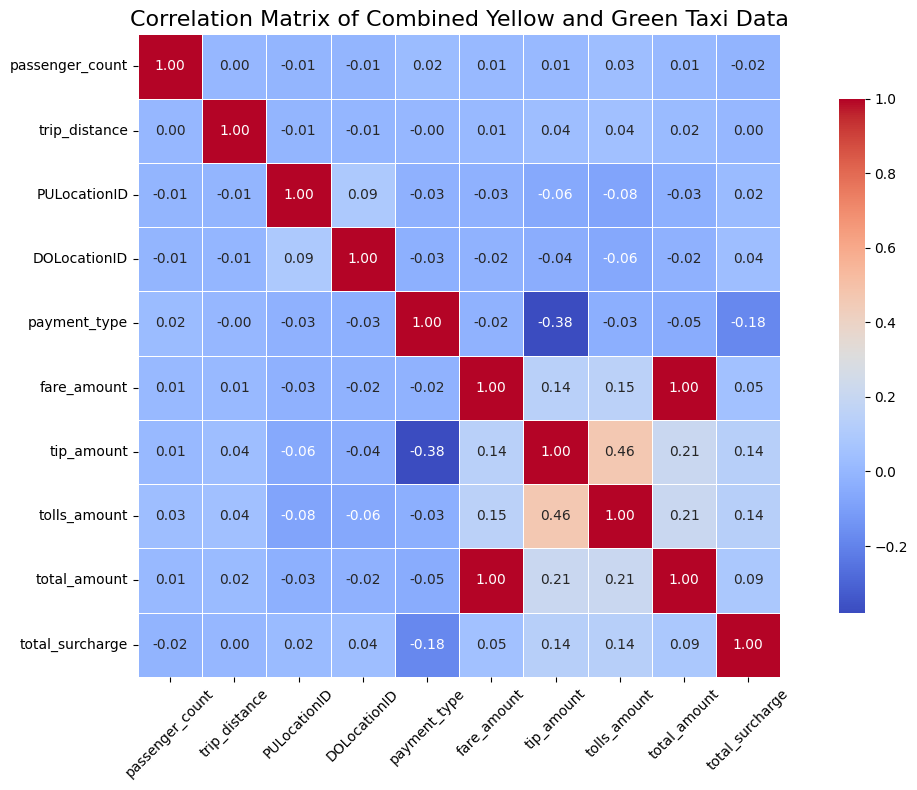

In [ ]:


# Convert any date columns to datetime if not already done
df_yellow['pickup_date'] = pd.to_datetime(df_yellow['pickup_date'])
df_yellow['dropoff_date'] = pd.to_datetime(df_yellow['dropoff_date'])

df_green['pickup_date'] = pd.to_datetime(df_green['pickup_date'])
df_green['dropoff_date'] = pd.to_datetime(df_green['dropoff_date'])

# Append df_green to df_yellow
df_combined = pd.concat([df_yellow, df_green], ignore_index=True)

# Drop non-numeric columns or convert them as needed
numeric_df_combined = df_combined.select_dtypes(include=['number'])

# Compute the correlation matrix on the numeric DataFrame
correlation_matrix = numeric_df_combined.corr()

# Set the size of the plot
plt.figure(figsize=(12, 8))

# Create a heatmap to visualize the correlation matrix
sns.heatmap(correlation_matrix,
            annot=True,               # Annotate the cells with the correlation coefficients
            fmt='.2f',               # Format for the annotations
            cmap='coolwarm',         # Colormap for the heatmap
            square=True,             # Make the cells square-shaped
            linewidths=0.5,         # Lines between the cells
            cbar_kws={"shrink": .8}) # Shrink the color bar

# Title and labels
plt.title('Correlation Matrix of Combined Yellow and Green Taxi Data', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)

# Show the plot
plt.tight_layout()
plt.show()


**Summary**: The correlation matrix offers a clear visualization of how different parameters are interrelated. By understanding these relationships, we establish a solid foundation for further analysis and the application of various frameworks to the dataset.


### Customer Pattern Analysis


---



---



**Question:** What payment method is prefered by customers?


---



In [ ]:

payment_method_mapping = {
    1: 'Credit card',
    2: 'Cash',
    3: 'No charge',
    4: 'Dispute',
    5: 'Unknown',
    6: 'Voided trip'
}

# Map the payment_type codes to payment method names in df_green
df_green['payment_method'] = df_green['payment_type'].map(payment_method_mapping)

# Calculate the count of each payment method for green taxis
payment_counts_green = df_green['payment_method'].value_counts().reset_index()
payment_counts_green.columns = ['Payment Method', 'Number of Rides']

# Calculate the percentage for green taxis
payment_counts_green['Percentage'] = (payment_counts_green['Number of Rides'] / payment_counts_green['Number of Rides'].sum()) * 100

# Display the results for green taxis
print("\nPayment Method Distribution for Green Taxis:")
print(payment_counts_green)

# Map the payment_type codes to payment method names in df_yellow
df_yellow['payment_method'] = df_yellow['payment_type'].map(payment_method_mapping)

# Calculate the count of each payment method for yellow taxis
payment_counts_yellow = df_yellow['payment_method'].value_counts().reset_index()
payment_counts_yellow.columns = ['Payment Method', 'Number of Rides']

# Calculate the percentage for yellow taxis
payment_counts_yellow['Percentage'] = (payment_counts_yellow['Number of Rides'] / payment_counts_yellow['Number of Rides'].sum()) * 100

# Display the results for yellow taxis
print("\nPayment Method Distribution for Yellow Taxis:")
print(payment_counts_yellow)


Payment Method Distribution for Green Taxis:
  Payment Method  Number of Rides  Percentage
0    Credit card           477994   65.902573
1           Cash           240445   33.150927
2      No charge             5259    0.725075
3        Dispute             1593    0.219632
4        Unknown               13    0.001792

Payment Method Distribution for Yellow Taxis:
  Payment Method  Number of Rides  Percentage
0    Credit card         29400047   80.729738
1           Cash          6296490   17.289564
2        Dispute           494682    1.358350
3      No charge           226644    0.622343
4        Unknown                2    0.000005


**Summary:**

65.9% of Green taxi rides and 80.7% of Yellow taxi rides are paid by credit card, highlighting that most users prefer to pay using credit card over cash.  

**Question**: Identifying boroughs that primarily contribute to the trip volume and revenue generation.


---




In [ ]:

location_name = pd.read_csv('/content/data/taxi_zone_lookup.csv')

# Merge df_yellow and df_green with location_name
with_location_name_yellow = pd.merge(df_yellow, location_name, how='left', left_on='PULocationID', right_on='LocationID')
with_location_name_green = pd.merge(df_green, location_name, how='left', left_on='PULocationID', right_on='LocationID')

# Clean the 'Borough' column
with_location_name_yellow['Borough'] = with_location_name_yellow['Borough'].str.strip().str.title().fillna('Unknown')
with_location_name_green['Borough'] = with_location_name_green['Borough'].str.strip().str.title().fillna('Unknown')

# Yellow Zone
order_count_by_zone_yellow = with_location_name_yellow.groupby('Borough').size()
total_orders_yellow = order_count_by_zone_yellow.sum()
order_ratio_by_zone_yellow = (order_count_by_zone_yellow / total_orders_yellow) * 100
average_fare_by_zone_yellow = with_location_name_yellow.groupby('Borough')['total_amount'].mean()

zone_summary_yellow = pd.DataFrame({
    'trip_count': order_count_by_zone_yellow,
    'trip_ratio (%)': order_ratio_by_zone_yellow,
    'average_fare ($)': average_fare_by_zone_yellow
}).sort_values(by='average_fare ($)', ascending=False).round(2).reset_index()

# Green Zone
order_count_by_zone_green = with_location_name_green.groupby('Borough').size()
total_orders_green = order_count_by_zone_green.sum()
order_ratio_by_zone_green = (order_count_by_zone_green / total_orders_green) * 100
average_fare_by_zone_green = with_location_name_green.groupby('Borough')['total_amount'].mean()

zone_summary_green = pd.DataFrame({
    'trip_count': order_count_by_zone_green,
    'trip_ratio (%)': order_ratio_by_zone_green,
    'average_fare ($)': average_fare_by_zone_green
}).sort_values(by='average_fare ($)', ascending=False).round(2).reset_index()

# Display Using Tabulate for Better Alignment
print("Yellow Zone Summary:\n")
print(tabulate(zone_summary_yellow.head(20), headers='keys', tablefmt='psql', showindex=False))

print("\nGreen Zone Summary:\n")
print(tabulate(zone_summary_green.head(20), headers='keys', tablefmt='psql', showindex=False))

Yellow Zone Summary:

+---------------+--------------+------------------+--------------------+
| Borough       |   trip_count |   trip_ratio (%) |   average_fare ($) |
|---------------+--------------+------------------+--------------------|
| Ewr           |         4958 |             0.01 |             102.68 |
| Queens        |      3684636 |            10.12 |              70.09 |
| Staten Island |         2454 |             0.01 |              64.48 |
| Unknown       |       371504 |             1.02 |              34.52 |
| Bronx         |        59887 |             0.16 |              34.49 |
| Brooklyn      |       206087 |             0.57 |              32.5  |
| Manhattan     |     32088339 |            88.11 |              23.56 |
+---------------+--------------+------------------+--------------------+

Green Zone Summary:

+---------------+--------------+------------------+--------------------+
| Borough       |   trip_count |   trip_ratio (%) |   average_fare ($) |
|------


**Summary:**

- Yellow Zone:
Manhattan has the highest trip ratio at 88.11% with an average fare of $23.56.

  The highest average fare is from EWR (Newark Airport) at $102.68.

- Green Zone:
Manhattan also has the highest trip ratio at 58.05% with an average fare of $20.92.

  EWR  (Newark Airport) has the highest average fare, $107.85.

  In both zones, Manhattan dominates in trip volume, while airport trips have significantly higher fares.

**Question**: How far do passengers typically travel on their trips?


---



In [ ]:
# --- Create aggregate trip counts by distance bin Dataframe ---
# Add 'Taxi Type' column
df_green['Taxi Type'] = 'Green'
df_yellow['Taxi Type'] = 'Yellow'

# Identify unique columns
columns_green = set(df_green.columns)
columns_yellow = set(df_yellow.columns)
unique_to_green = columns_green - columns_yellow
unique_to_yellow = columns_yellow - columns_green

# Add missing columns to df_yellow and df_green
for col in unique_to_green:
    df_yellow[col] = np.nan
for col in unique_to_yellow:
    df_green[col] = np.nan

# Reorder df_yellow columns to match df_green
columns_order = df_green.columns.tolist()
df_yellow = df_yellow[columns_order]

# Concatenate DataFrames
df_combined = pd.concat([df_green, df_yellow], ignore_index=True, sort=False)
df_combined.reset_index(drop=True, inplace=True)

# Optimize memory usage
df_combined['Taxi Type'] = df_combined['Taxi Type'].astype('category')

# Identify numerical columns for downcasting
numerical_cols = df_combined.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Downcast numerical columns
df_combined[numerical_cols] = df_combined[numerical_cols].apply(pd.to_numeric, downcast='float')

# Process and Aggregate Data
def process_and_aggregate(df, distance_bin_size=0.5, max_distance=10):
    # Select columns
    df = df[['trip_distance', 'Taxi Type']].copy()

    # Remove trips with non-positive trip distances
    df = df[df['trip_distance'] > 0]

    # Define trip distance bins
    bins = np.arange(0, max_distance + distance_bin_size, distance_bin_size)
    labels = bins[:-1] + distance_bin_size / 2  # Midpoint labels for bins

    # Bin the trip distances
    df['distance_bin'] = pd.cut(df['trip_distance'], bins=bins, labels=labels, include_lowest=True)

    # Drop any rows with NaN in 'distance_bin' (if any)
    df.dropna(subset=['distance_bin'], inplace=True)

    # Convert 'distance_bin' to float for numerical operations
    df['distance_bin'] = df['distance_bin'].astype(float)

    # Aggregate trip counts by distance bin and taxi type
    aggregated_df = df.groupby(['distance_bin', 'Taxi Type']).agg(
        trip_count=('Taxi Type', 'count')
    ).reset_index()

    return aggregated_df

# Process and aggregate data
aggregated_combined = process_and_aggregate(df_combined, distance_bin_size=0.5, max_distance=10)

# Convert 'Taxi Type' to categorical (if not already)
aggregated_combined['Taxi Type'] = aggregated_combined['Taxi Type'].astype('category')

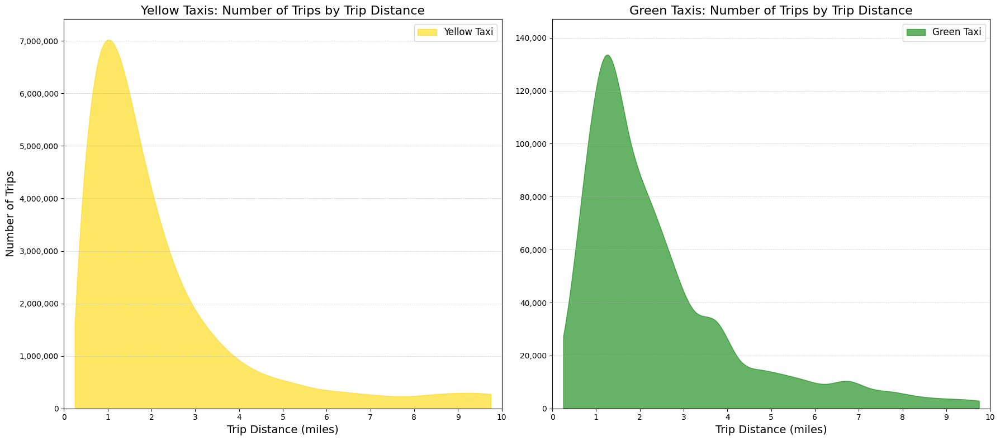

In [ ]:
# Set the color palette for the area chart
colors = {'Yellow': 'gold', 'Green': 'green'}

# Create subplots: one for Yellow taxis and one for Green taxis (without sharing y-axis)
fig, axes = plt.subplots(1, 2, figsize=(18, 8))  # No 'sharey' parameter

# Function to smooth the data using interpolation
def smooth_data(x, y, points=300):
    x_new = np.linspace(x.min(), x.max(), points)  # New evenly spaced x values
    spline = make_interp_spline(x, y)             # Create spline function
    y_smooth = spline(x_new)                      # Get the smooth y values
    return x_new, y_smooth

# Smooth data for Yellow taxis
x_yellow = aggregated_combined[aggregated_combined['Taxi Type'] == 'Yellow']['distance_bin']
y_yellow = aggregated_combined[aggregated_combined['Taxi Type'] == 'Yellow']['trip_count']
x_yellow_smooth, y_yellow_smooth = smooth_data(x_yellow, y_yellow)

# Smooth data for Green taxis
x_green = aggregated_combined[aggregated_combined['Taxi Type'] == 'Green']['distance_bin']
y_green = aggregated_combined[aggregated_combined['Taxi Type'] == 'Green']['trip_count']
x_green_smooth, y_green_smooth = smooth_data(x_green, y_green)

# Plot Yellow taxis in the first subplot
axes[0].fill_between(x_yellow_smooth, y_yellow_smooth, color=colors['Yellow'], alpha=0.6, label='Yellow Taxi')
axes[0].set_title('Yellow Taxis: Number of Trips by Trip Distance', fontsize=16)
axes[0].set_xlabel('Trip Distance (miles)', fontsize=14)
axes[0].set_ylabel('Number of Trips', fontsize=14)
axes[0].grid(True, axis='y', linestyle='--', linewidth=0.5, alpha=0.7)
axes[0].legend(fontsize=12)

# Set y-axis limit according to Yellow data
axes[0].set_xlim(0, 10)
axes[0].set_ylim(0, y_yellow.max() * 1.1)  # Adjust according to Yellow taxi data
axes[0].xaxis.set_major_locator(plt.MultipleLocator(1))

# Plot Green taxis in the second subplot
axes[1].fill_between(x_green_smooth, y_green_smooth, color=colors['Green'], alpha=0.6, label='Green Taxi')
axes[1].set_title('Green Taxis: Number of Trips by Trip Distance', fontsize=16)
axes[1].set_xlabel('Trip Distance (miles)', fontsize=14)
axes[1].grid(True, axis='y', linestyle='--', linewidth=0.5, alpha=0.7)
axes[1].legend(fontsize=12)

# Set y-axis limit according to Green data
axes[1].set_xlim(0, 10)
axes[1].set_ylim(0, y_green.max() * 1.1)  # Adjust according to Green taxi data
axes[1].xaxis.set_major_locator(plt.MultipleLocator(1))

# Format y-axis values with commas for both subplots
axes[0].yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))
axes[1].yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))

# Adjust layout to prevent overlap and display the plot
plt.tight_layout()
plt.show()

**Summary**: The majority of taxi trips for both Green and Yellow taxis are concentrated within 2-4 miles. However, Yellow taxis show a much higher volume in this range. Green taxis tend to have a lower overall usage across all distances but show similar behavior in terms of trip concentration at short distances. As the trip distance increases exceeding 6 miles, both types of taxis experience a decline in the number of trips and  begin to flatten.

**Question**: Analyze customer travel patterns throughout the day for green taxis.


---




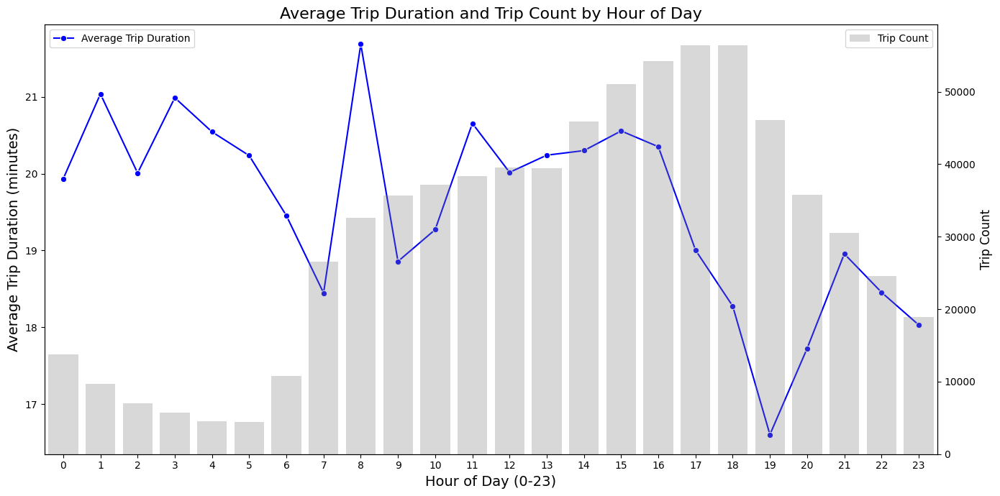

In [ ]:

# Convert 'pickup_date' and 'dropoff_date' to datetime if they are still objects
df_green['pickup_date'] = pd.to_datetime(df_green['pickup_date'], errors='coerce')
df_green['dropoff_date'] = pd.to_datetime(df_green['dropoff_date'], errors='coerce')

# Combine 'pickup_date' and 'pickup_time' into 'pickup_datetime' without string concatenation
df_green['pickup_datetime'] = df_green['pickup_date'] + pd.to_timedelta(df_green['pickup_time'].dt.hour, unit='h') \
                                                      + pd.to_timedelta(df_green['pickup_time'].dt.minute, unit='m') \
                                                      + pd.to_timedelta(df_green['pickup_time'].dt.second, unit='s')

# Extract 'pickup_hour' from 'pickup_datetime'
df_green['pickup_hour'] = df_green['pickup_datetime'].dt.hour

# Calculating Trip Duration
df_green['trip_duration'] = (df_green['dropoff_datetime'] - df_green['pickup_datetime']).dt.total_seconds() / 60

# Aggregate average trip duration and trip count by hour
agg_hour = df_green.groupby('pickup_hour').agg(
    avg_trip_duration=('trip_duration', 'mean'),
    trip_count=('pickup_hour', 'count')
).reset_index()

# Visualization
plt.figure(figsize=(14, 7))

# Plotting Average Trip Duration on the primary y-axis
sns.lineplot(data=agg_hour, x='pickup_hour', y='avg_trip_duration', marker='o', label='Average Trip Duration', color='blue')

# Adding secondary y-axis for trip count
ax1 = plt.gca()
ax2 = ax1.twinx()

# Plotting Trip Count as Bars (grey color)
sns.barplot(data=agg_hour, x='pickup_hour', y='trip_count', alpha=0.3, color='grey', ax=ax2, label='Trip Count')
ax2.set_ylabel('Trip Count', fontsize=12)
ax2.legend(loc='upper right')

# Set axis labels and title
ax1.set_xlabel('Hour of Day (0-23)', fontsize=14)
ax1.set_ylabel('Average Trip Duration (minutes)', fontsize=14)
plt.title('Average Trip Duration and Trip Count by Hour of Day', fontsize=16)

# Display legend
ax1.legend(loc='upper left')

plt.tight_layout()
plt.show()


**Summary**:
This chart analyzes the average trip duration and trip count by hour of the day, revealing key customer travel patterns. Trip durations peak during the early morning hours, particularly around 6 AM and 7 AM, likely due to longer commutes. In contrast, the highest trip volume occurs between 2 PM and 6 PM, indicating that the afternoon sees the greatest ride demand, despite trips being relatively shorter. Trip count significantly drops between 1 AM and 5 AM, reflecting minimal demand during late-night hours. These insights can help optimize driver allocation and pricing strategies during peak demand and lower-activity periods.

**Question**：Do customers generally travel alone or in groups?

---



<Figure size 1200x600 with 0 Axes>

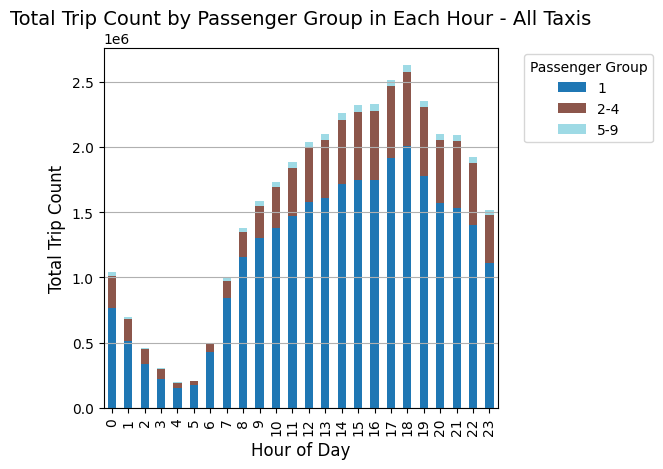

In [ ]:

from IPython.display import display

# Function to categorize passenger counts into groups: '1', '2-4', '5-9', 'Other'
def categorize_passenger_count(x):
    if x == 1:
        return '1'
    elif 2 <= x <= 4:
        return '2-4'
    elif 5 <= x <= 9:
        return '5-9'
    else:
        return 'Other'

# Process Green Taxi Data
# Prepend a fixed date to 'pickup_time' and convert to datetime (similar to yellow)
df_green['pickup_time'] = pd.to_datetime('2023-01-01 ' + df_green['pickup_time'].astype(str))

# Extract hour information from 'pickup_time'
df_green['hour'] = df_green['pickup_time'].dt.hour

# Categorize passenger counts into defined groups
df_green['passenger_group'] = df_green['passenger_count'].apply(categorize_passenger_count)

# Add 'taxi_type' column
df_green['taxi_type'] = 'Green'

# Process Yellow Taxi Data
# Prepend a fixed date to 'pickup_time' and convert to datetime
df_yellow['pickup_time'] = pd.to_datetime('2023-01-01 ' + df_yellow['pickup_time'].astype(str))

# Extract hour information from 'pickup_time'
df_yellow['hour'] = df_yellow['pickup_time'].dt.hour

# Categorize passenger counts
df_yellow['passenger_group'] = df_yellow['passenger_count'].apply(categorize_passenger_count)

# Add 'taxi_type' column
df_yellow['taxi_type'] = 'Yellow'

# Select relevant columns to match between datasets
df_green_selected = df_green[['hour', 'passenger_group', 'taxi_type']]
df_yellow_selected = df_yellow[['hour', 'passenger_group', 'taxi_type']]

# Combine the two dataframes
df_combined = pd.concat([df_green_selected, df_yellow_selected], ignore_index=True)

# Compute total trip count per hour
hourly_trip_count_combined = df_combined.groupby('hour').size().reset_index(name='total_trip_count')

# Compute trip counts per hour and passenger group
passenger_group_trip_count_combined = df_combined.groupby(['hour', 'passenger_group']).size().reset_index(name='group_trip_count')

# Merge the passenger group trip counts with the total trip counts per hour
merged_data_combined = pd.merge(passenger_group_trip_count_combined, hourly_trip_count_combined, on='hour')

# Create a pivot table for the total trip count stacked bar chart
pivot_df_total_combined = merged_data_combined.pivot(index='hour', columns='passenger_group', values='group_trip_count')

# Plot the total trip count stacked bar chart for All Taxis
plt.figure(figsize=(12, 6))
pivot_df_total_combined.plot(kind='bar', stacked=True, cmap='tab20')
plt.title('Total Trip Count by Passenger Group in Each Hour - All Taxis', fontsize=14)
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('Total Trip Count', fontsize=12)
plt.legend(title='Passenger Group', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


Summary:
The chart shows most trips are by single passengers, especially during peak hours (2 PM to 6 PM), with smaller groups (2-4 people) also contributing but at a lower rate. Larger groups (5-9 people) have minimal trips throughout the day.



### Resource Allocation Optimization Insights


---



**Question**: Identify the Most Popular Pickup and Drop-off Locations. Which locations have the highest pick up to drop off ratio?


---



In [ ]:

# Function to get top N zones for pickup and dropoff
def get_top_zones(df, pickup_col_zone, pickup_col_borough, dropoff_col_zone, dropoff_col_borough, top_n=10):
    # Top Pickup Zones
    top_pickup = df.groupby([pickup_col_zone, pickup_col_borough]).size().reset_index(name='Count').sort_values(by='Count', ascending=False).head(top_n)

    # Top Dropoff Zones
    top_dropoff = df.groupby([dropoff_col_zone, dropoff_col_borough]).size().reset_index(name='Count').sort_values(by='Count', ascending=False).head(top_n)

    return top_pickup, top_dropoff

# Function to display top zones using tabulate
def display_top_zones(top_pickup, top_dropoff, taxi_type):
    print(f"Top 10 {taxi_type} Taxi Pickup Locations (Zone and Borough):\n")
    print(tabulate(top_pickup, headers='keys', tablefmt='psql', showindex=False))
    print(f"\nTop 10 {taxi_type} Taxi Drop-off Locations (Zone and Borough):\n")
    print(tabulate(top_dropoff, headers='keys', tablefmt='psql', showindex=False))
    print("\n" + "-"*80 + "\n")

# Get Top 10 Zones for Green Taxis
top_pickup_green, top_dropoff_green = get_top_zones(
    with_location_name_green, 'Zone', 'Borough', 'Zone', 'Borough', top_n=10
)

# Get Top 10 Zones for Yellow Taxis
top_pickup_yellow, top_dropoff_yellow = get_top_zones(
    with_location_name_yellow, 'Zone', 'Borough', 'Zone', 'Borough', top_n=10
)

# Display Top 10 Zones for Green Taxis
display_top_zones(top_pickup_green, top_dropoff_green, "Green")

# Display Top 10 Zones for Yellow Taxis
display_top_zones(top_pickup_yellow, top_dropoff_yellow, "Yellow")

Top 10 Green Taxi Pickup Locations (Zone and Borough):

+-----------------------------+-----------+---------+
| Zone                        | Borough   |   Count |
|-----------------------------+-----------+---------|
| East Harlem North           | Manhattan |  155115 |
| East Harlem South           | Manhattan |   97075 |
| Forest Hills                | Queens    |   40005 |
| Central Harlem              | Manhattan |   38899 |
| Morningside Heights         | Manhattan |   38147 |
| Elmhurst                    | Queens    |   32159 |
| Central Park                | Manhattan |   32056 |
| Fort Greene                 | Brooklyn  |   21516 |
| Downtown Brooklyn/MetroTech | Brooklyn  |   18562 |
| Jamaica                     | Queens    |   17793 |
+-----------------------------+-----------+---------+

Top 10 Green Taxi Drop-off Locations (Zone and Borough):

+-----------------------------+-----------+---------+
| Zone                        | Borough   |   Count |
|--------------------

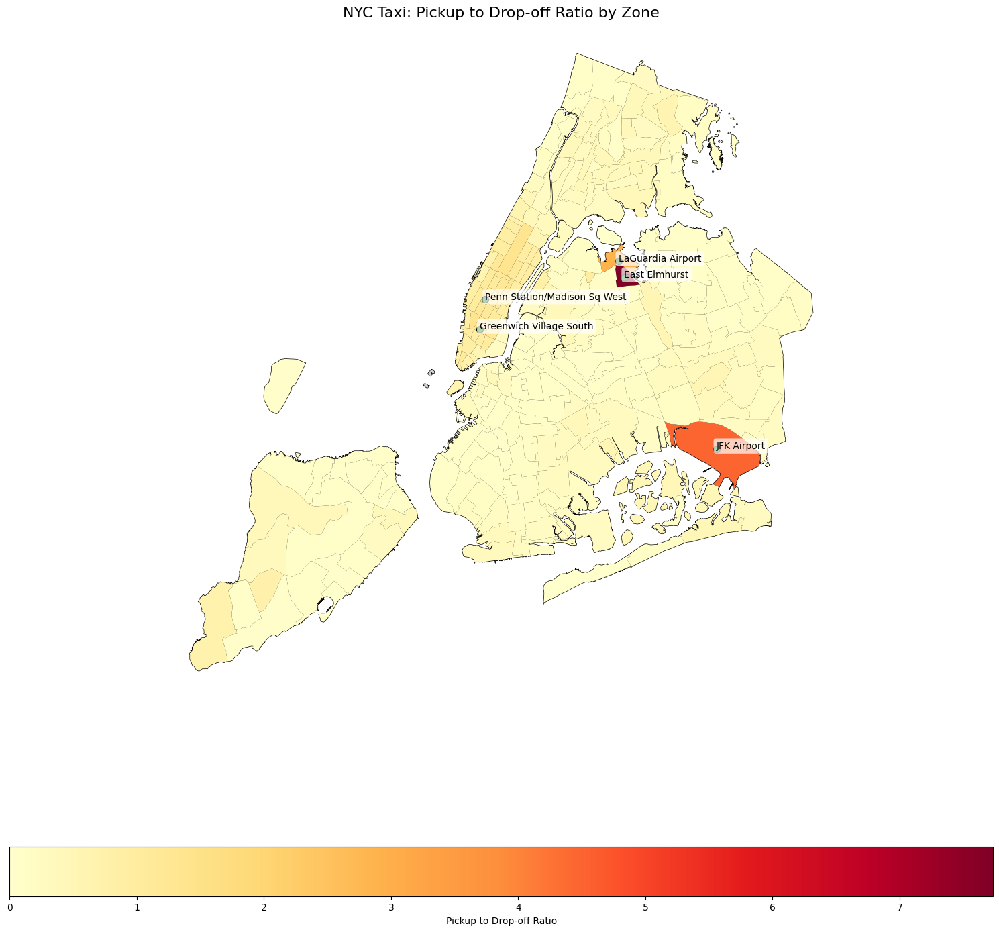

In [ ]:
# Load the datasets
df = pd.read_parquet('/content/data/yellow_trips/yellow_tripdata_2023.parquet')

# Load the shapefile
zones = gpd.read_file('/content/data/yellow_trips/taxi_zones.shp')

# Count pickups and drop-offs for each zone
pickups = df['PULocationID'].value_counts()
dropoffs = df['DOLocationID'].value_counts()

# Calculate the  pickup to drop-offratio
ratio = pickups.div(dropoffs).fillna(0)

# Merge the ratio data with zones
zones['ratio'] = zones['OBJECTID'].map(ratio)

# Create the plot
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the base map with zones
zones.plot(ax=ax, color='white', edgecolor='black')

# Plot the ratio heatmap
zones.plot(column='ratio', ax=ax, legend=True,
           legend_kwds={'label': 'Pickup to Drop-off Ratio', 'orientation': 'horizontal'},
           cmap='YlOrRd', missing_kwds={'color': 'lightgrey'})

# Customize the plot title and remove axis labels
plt.title('NYC Taxi: Pickup to Drop-off Ratio by Zone', fontsize=16)
plt.axis('off')

# Find the top 5 zones based on pickup-to-dropoff ratio
top_5_zones = ratio.nlargest(5).index

# Match top 5 LocationID's with zone names from the shapefile
top_5_data = zones[zones['OBJECTID'].isin(top_5_zones)]

# Function to adjust annotation position based on centroid location
def get_annotation_offset(centroid, boundary):
    """
    Adjusts the annotation placement depending on the zone's centroid position relative to the plot boundary.
    """
    offset_x = 0
    offset_y = 0

    # Check if centroid is towards the left, right, top, or bottom edge and adjust accordingly
    if centroid.x < boundary.bounds[0] + (boundary.bounds[2] - boundary.bounds[0]) * 0.25:  # Left edge
        offset_x = 0.08  # Shift text to the right
    elif centroid.x > boundary.bounds[0] + (boundary.bounds[2] - boundary.bounds[0]) * 0.75:  # Right edge
        offset_x = -0.08  # Shift text to the left
    if centroid.y < boundary.bounds[1] + (boundary.bounds[3] - boundary.bounds[1]) * 0.25:  # Bottom edge
        offset_y = 0.08  # Shift text upwards
    elif centroid.y > boundary.bounds[1] + (boundary.bounds[3] - boundary.bounds[1]) * 0.75:  # Top edge
        offset_y = -0.08  # Shift text downwards

    return offset_x, offset_y

# Plot circles at the centroids of top 10 zones and label them with zone names
for idx, row in top_5_data.iterrows():
    zone_name = row['zone']  # Assuming the 'zone' column has the zone names
    centroid = row['geometry'].centroid  # Calculate the centroid of each zone
    ax.scatter(centroid.x, centroid.y, color='green', s=50, edgecolor='black', zorder=5)

    # Calculate offset based on location
    offset_x, offset_y = get_annotation_offset(centroid, row['geometry'])

    # Annotate the zone name with the calculated offset
    ax.annotate(text=zone_name, xy=(centroid.x, centroid.y),
                xytext=(centroid.x + offset_x, centroid.y + offset_y),
                ha='left', fontsize=10, color='black', zorder=6,
                bbox=dict(boxstyle="round,pad=0.3", edgecolor="none", facecolor="white", alpha=0.7))

# Display the plot
plt.tight_layout()
plt.show()



**Summary**: We notice similarities in the top pickup and drop off locations in both yellow and green zones. This chart highlights the top 5 locations in NYC with the highest pickup-to-dropoff ratios. A higher ratio suggests that more pickups occur than dropoffs, indicating increased trip demand and lower post-dropoff taxi availability. Notably, airports and railway hubs show the highest ratios, signaling greater demand and more opportunities for prospective drivers in these areas.

Determining the number of taxi's to have on standby at the right locations throughout the day

---



In [ ]:
# Enable bokeh output in notebook
output_notebook()

# Assuming df_yellow is your dataset and zones is your shapefile
df_yellow['pickup_time'] = pd.to_datetime(df_yellow['pickup_time'], format='%H:%M:%S')  # Ensure pickup_time is datetime

# Create a new column for the hour of the day (0-23)
df_yellow['pickup_hour'] = df_yellow['pickup_time'].dt.hour

# Aggregate pickup counts by PULocationID and pickup_hour
zone_pickups = df_yellow.groupby(['PULocationID', 'pickup_hour']).size().reset_index(name='pickup_count')

# Pivot the data so each hour of the day becomes a column
pivot_zone_pickups = zone_pickups.pivot(index='PULocationID', columns='pickup_hour', values='pickup_count').fillna(0)

# Load the zones shapefile data
zones = gpd.read_file('data/yellow_trips/taxi_zones.shp')

# Merge with the shapefile data
zones = zones.merge(pivot_zone_pickups, left_on='OBJECTID', right_on='PULocationID', how='left')

# Ensure geometry column is correctly set
zones = gpd.GeoDataFrame(zones, geometry='geometry')

# Exclude non-numeric columns like 'geometry' for the color mapper's max value calculation
numeric_columns = pivot_zone_pickups.columns  # Get hour columns
max_value = zones[numeric_columns].max().max()  # Max value from pickup counts

# Convert GeoDataFrame to GeoJSON format for Bokeh
geosource = GeoJSONDataSource(geojson=zones.to_json())

# Define a color palette for visualization
palette = OrRd[9][::-1]  # Reverse OrRd palette to make dark red indicate higher values
color_mapper = LinearColorMapper(palette=palette, low=0, high=max_value)  # Use calculated max_value

# Create the initial Bokeh plot
p = figure(title="NYC Taxi Pickup Volume by Zone (Hourly)",
           height=600, width=800,
           toolbar_location="left", tools="pan, wheel_zoom, reset")

p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None

# Add map zones to the plot
patch_renderer = p.patches('xs', 'ys', source=geosource,
          fill_color={'field': '0', 'transform': color_mapper},  # Default field for 00:00 (midnight)
          fill_alpha=0.7, line_color="black", line_width=0.5)

# Add a hover tool
hover = HoverTool(tooltips=[('Zone', '@zone'), ('Pickups', '@0')])  # Default hour for hover info
p.add_tools(hover)

# Add a color bar for reference
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8, width=500, height=20,
                     location=(0, 0), orientation='horizontal')

p.add_layout(color_bar, 'below')

# JavaScript callback for the slider and play feature
callback = CustomJS(args=dict(patches=patch_renderer, color_mapper=color_mapper, geosource=geosource, hover=hover),
                    code="""
    var selected_hour = cb_obj.value;

    // Update the fill_color based on the selected hour
    patches.glyph.fill_color = {field: selected_hour.toString(), transform: color_mapper};

    // Update the hover tool to show the correct pickups for the selected hour
    hover.tooltips = [['Zone', '@zone'], ['Pickups', '@' + selected_hour.toString()]];

    // Trigger update
    geosource.change.emit();
""")

# Create a slider for the hours of the day (0-23)
hour_slider = Slider(start=0, end=23, value=0, step=1, title="Hour of the Day")

# Attach the callback to the slider
hour_slider.js_on_change('value', callback)

# JavaScript for the play button to automatically change hours
play_callback = CustomJS(args=dict(hour_slider=hour_slider),
                         code="""
    if (window.playInterval) {
        clearInterval(window.playInterval);  // Clear any existing interval to prevent multiple intervals
    }
    var index = hour_slider.value;  // Start from the current hour
    window.playInterval = setInterval(function() {
        hour_slider.value = index;  // Set the slider to the next hour
        index++;
        if (index > 23) {  // Reset to 0 after 23
            index = 0;
        }
    }, 1500);  // Change every 1000 ms (1 seconds) to slow down the playback
""")

# JavaScript for the stop button
stop_callback = CustomJS(code="""
    if (window.playInterval) {
        clearInterval(window.playInterval);  // Clear the interval to stop the playback
    }
""")

# Create play and stop buttons
play_button = Button(label="Play", button_type="success")
play_button.js_on_click(play_callback)

stop_button = Button(label="Stop", button_type="danger")
stop_button.js_on_click(stop_callback)

# Layout the play button, stop button, slider, and plot
layout = column(row(play_button, stop_button), hour_slider, p)

p.xgrid.grid_line_color = None  # Remove x-grid lines
p.ygrid.grid_line_color = None  # Remove y-grid lines

p.axis.visible = False  # Hide both x and y axes (ticks, labels, etc.)


# Display the interactive plot
show(layout)


**Summary:** We observe minimal taxi movement during the first six hours of the day. This graph provides a clear visual of taxi volume pattern as the day progresses. Midtown Center and Upper East Side South, being centrally located, experience higher traffic overall. Additionally, traffic at JFK Airport increases throughout the day, with peaks during the 16th and 22nd hours. This data can guide us in positioning cabs at the right locations and times for optimal availability.


Planning taxi allocation for each day during the week based on historic data


---



In [ ]:
import pandas as pd
import geopandas as gpd
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar, HoverTool, Select, Button, CustomJS
from bokeh.layouts import column, row
from bokeh.palettes import OrRd
import json

# Enable bokeh output in notebook
output_notebook()

# Assuming df_yellow is your dataset and zones is your shapefile
df_yellow['pickup_date'] = pd.to_datetime(df_yellow['pickup_date'])  # Ensure pickup_date is datetime

# Create a new column for the day of the week (Monday=0, Sunday=6)
df_yellow['pickup_day_of_week'] = df_yellow['pickup_date'].dt.dayofweek

# Aggregate pickup counts by PULocationID and pickup_day_of_week
zone_pickups = df_yellow.groupby(['PULocationID', 'pickup_day_of_week']).size().reset_index(name='pickup_count')

# Pivot the data so each day of the week becomes a column
pivot_zone_pickups = zone_pickups.pivot(index='PULocationID', columns='pickup_day_of_week', values='pickup_count').fillna(0)

# Load the zones shapefile data
zones = gpd.read_file('data/yellow_trips/taxi_zones.shp')

# Merge with the shapefile data
zones = zones.merge(pivot_zone_pickups, left_on='OBJECTID', right_on='PULocationID', how='left')

# Ensure geometry column is correctly set
zones = gpd.GeoDataFrame(zones, geometry='geometry')

# Exclude non-numeric columns like 'geometry' for the color mapper's max value calculation
numeric_columns = pivot_zone_pickups.columns  # Get day columns (0=Monday, 6=Sunday)
max_value = zones[numeric_columns].max().max()  # Max value from pickup counts

# Convert GeoDataFrame to GeoJSON format for Bokeh
geosource = GeoJSONDataSource(geojson=zones.to_json())

# Define a color palette for visualization
palette = OrRd[9][::-1]  # Reverse OrRd palette to make dark red indicate higher values
color_mapper = LinearColorMapper(palette=palette, low=0, high=max_value)  # Use calculated max_value

# Create the initial Bokeh plot
p = figure(title="NYC Taxi Pickup Volume by Zone (Days of the Week)",
           height=600, width=800,
           toolbar_location="left", tools="pan, wheel_zoom, reset")

p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None

# Add map zones to the plot
patch_renderer = p.patches('xs', 'ys', source=geosource,
          fill_color={'field': '0', 'transform': color_mapper},  # Default field for Monday (0)
          fill_alpha=0.7, line_color="black", line_width=0.5)

# Add a hover tool
hover = HoverTool(tooltips=[('Zone', '@zone'), ('Pickups', '@0')])  # Default day for hover info
p.add_tools(hover)

# Add a color bar for reference
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8, width=500, height=20,
                     location=(0, 0), orientation='horizontal')

p.add_layout(color_bar, 'below')

# Days of the week mapping (for display purposes)
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# JavaScript callback for the dropdown menu and play feature
callback = CustomJS(args=dict(patches=patch_renderer, color_mapper=color_mapper, geosource=geosource, hover=hover),
                    code="""
    var selected_day = cb_obj.value;

    // Update the fill_color based on the selected day
    patches.glyph.fill_color = {field: selected_day, transform: color_mapper};

    // Update the hover tool to show the correct pickups for the selected day
    hover.tooltips = [['Zone', '@zone'], ['Pickups', '@' + selected_day]];

    // Trigger update
    geosource.change.emit();
""")

# Create a dropdown menu for the days of the week (0=Monday, 6=Sunday)
day_dropdown = Select(title="Day of the Week", value='0', options=[('0', 'Monday'), ('1', 'Tuesday'), ('2', 'Wednesday'), ('3', 'Thursday'), ('4', 'Friday'), ('5', 'Saturday'), ('6', 'Sunday')])

# Attach the callback to the dropdown
day_dropdown.js_on_change('value', callback)

# JavaScript for the play button to automatically change days
play_callback = CustomJS(args=dict(day_dropdown=day_dropdown),
                         code="""
    if (window.playInterval) {
        clearInterval(window.playInterval);  // Clear any existing interval to prevent multiple intervals
    }
    var index = parseInt(day_dropdown.value);  // Start from the current day
    window.playInterval = setInterval(function() {
        day_dropdown.value = index.toString();  // Set the dropdown to the next day
        index++;
        if (index > 6) {  // Reset to 0 after Sunday (6)
            index = 0;
        }
    }, 2000);  // Change every 2000 ms (2 seconds) to slow down the playback
""")

# JavaScript for the stop button
stop_callback = CustomJS(code="""
    if (window.playInterval) {
        clearInterval(window.playInterval);  // Clear the interval to stop the playback
    }
""")

# Create play and stop buttons
play_button = Button(label="Play", button_type="success")
play_button.js_on_click(play_callback)

stop_button = Button(label="Stop", button_type="danger")
stop_button.js_on_click(stop_callback)

# Layout the play button, stop button, dropdown, and plot
layout = column(row(play_button, stop_button), day_dropdown, p)

p.xgrid.grid_line_color = None  # Remove x-grid lines
p.ygrid.grid_line_color = None  # Remove y-grid lines

p.axis.visible = False  # Hide both x and y axes (ticks, labels, etc.)


# Display the interactive plot
show(layout)


**Summary:** This plot highlights taxi movement trends across the days of the week. We observe that Mondays and Sundays experience the highest traffic at JFK Airport. Traffic peaks in the city center on Tuesdays and Wednesdays, while Sundays show a significant drop in city traffic. This insight suggests that we can allocate more cabs to JFK Airport on Sundays to better meet demand.


**Question :** How do the weekly trip counts of NYC green and yellow taxis compare throughout 2023, including holiday influences?


---



<ipython-input-24-43b86f446aa6>:32: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  weekly_trip_count_yellow['trip_count'].fillna(method='ffill', inplace=True)
<ipython-input-24-43b86f446aa6>:32: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_trip_count_yellow['trip_count'].fillna(method='ffill', inplace=True)


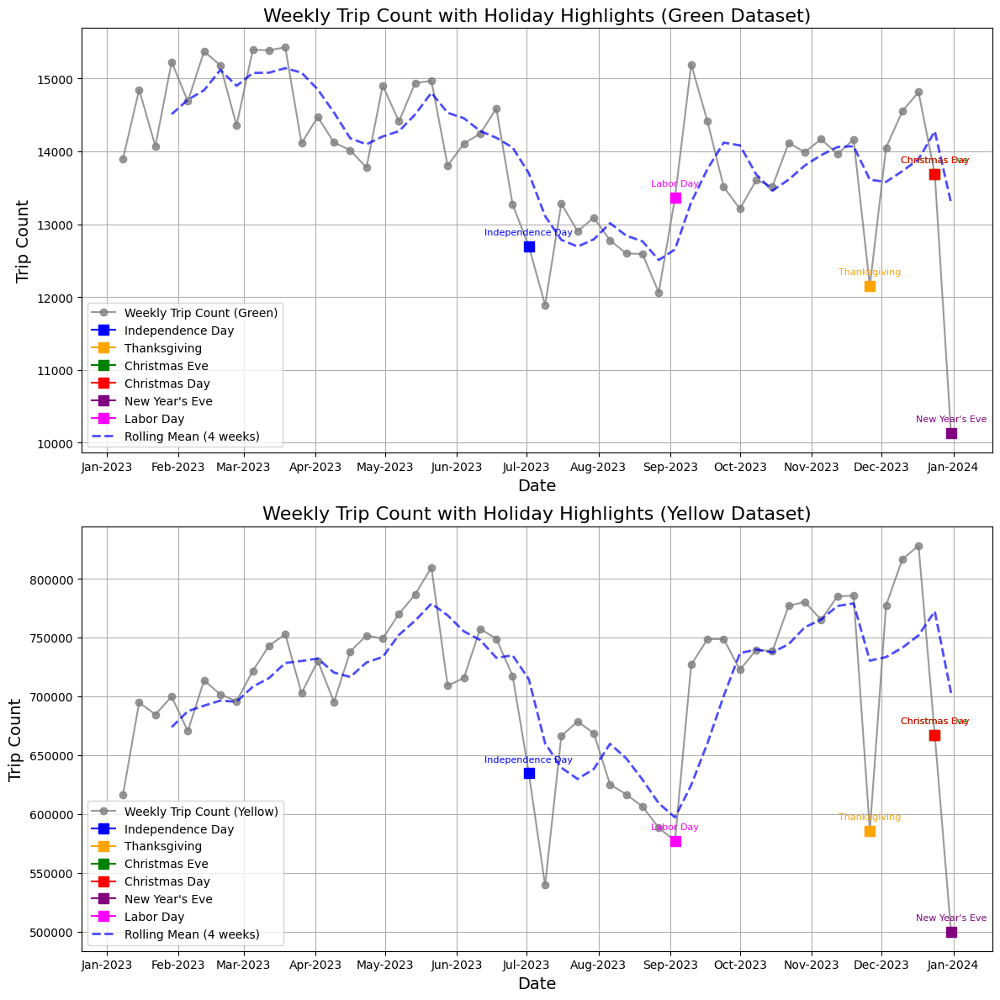

In [ ]:
# drop dates outside of 2023 green
df_green['pickup_date'] = pd.to_datetime(df_green['pickup_date'])
df_green.drop(df_green[df_green['pickup_date'] < pd.to_datetime('2023-01-01')].index, inplace=True)

# drop dates outside of 2023 yellow
df_yellow['pickup_date'] = pd.to_datetime(df_yellow['pickup_date'])
mask = (df_yellow['pickup_date'] >= '2023-01-01') & (df_yellow['pickup_date'] <= '2023-12-31')
df_yellow = df_yellow[mask]

# yellow and green subplot



# Extract trip count data grouped by weekly periods
df_green['pickup_date'] = pd.to_datetime(df_green['pickup_date'])  # Ensure 'pickup_date' is datetime type
df_yellow['pickup_date'] = pd.to_datetime(df_yellow['pickup_date'])  # Ensure 'pickup_date' is datetime type

weekly_trip_count_green = df_green.resample('W', on='pickup_date').size().reset_index(name='trip_count')
weekly_trip_count_green = weekly_trip_count_green.iloc[1:]

weekly_trip_count_yellow = df_yellow.resample('W', on='pickup_date').size().reset_index(name='trip_count')

# make outlier Nan and fillna
weekly_trip_count_yellow.loc[38, 'trip_count'] = np.nan
weekly_trip_count_yellow['trip_count'].fillna(method='ffill', inplace=True)

weekly_trip_count_yellow = weekly_trip_count_yellow.iloc[1:]

# Marking US holidays to highlight
holidays = [
    ('2023-07-04', "Independence Day", 'blue'),  # Independence Day
    ('2023-11-23', "Thanksgiving", 'orange'),    # Thanksgiving (fourth Thursday)
    ('2023-12-24', "Christmas Eve", 'green'),    # Christmas Eve
    ('2023-12-25', "Christmas Day", 'red'),      # Christmas Day
    ('2023-12-31', "New Year's Eve", 'purple'),  # New Year's Eve
    ('2023-01-01', "New Year's Day", 'cyan'),    # New Year's Day
    ('2023-09-04', "Labor Day", 'magenta')       # Labor Day (First Monday in September)
]

# Calculate 4-week rolling mean
weekly_trip_count_green['rolling_mean_4w'] = weekly_trip_count_green['trip_count'].rolling(window=4).mean()
weekly_trip_count_yellow['rolling_mean_4w'] = weekly_trip_count_yellow['trip_count'].rolling(window=4).mean()

# Plotting the weekly trip counts
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))

# Plot for Green dataset
ax1.plot(weekly_trip_count_green['pickup_date'], weekly_trip_count_green['trip_count'], marker='o', linestyle='-', color='gray', alpha=0.8, label='Weekly Trip Count (Green)')
for date_str, holiday_name, color in holidays:
    holiday_date = pd.to_datetime(date_str)
    if holiday_date >= weekly_trip_count_green['pickup_date'].min() and holiday_date <= weekly_trip_count_green['pickup_date'].max():
        closest_date = weekly_trip_count_green.loc[(weekly_trip_count_green['pickup_date'] - holiday_date).abs().idxmin()]['pickup_date']
        holiday_trip_count = weekly_trip_count_green[weekly_trip_count_green['pickup_date'] == closest_date]['trip_count'].values[0]
        ax1.plot(closest_date, holiday_trip_count, marker='s', color=color, markersize=8, label=f'{holiday_name}')
        ax1.annotate(holiday_name, (closest_date, holiday_trip_count), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8, color=color)
ax1.plot(weekly_trip_count_green['pickup_date'], weekly_trip_count_green['rolling_mean_4w'], color='blue', alpha=0.7, linestyle='--', linewidth=2, label='Rolling Mean (4 weeks)')
ax1.set_title('Weekly Trip Count with Holiday Highlights (Green Dataset)', fontsize=16)
ax1.set_xlabel('Date', fontsize=14)
ax1.set_ylabel('Trip Count', fontsize=14)
ax1.xaxis.set_major_locator(mdates.MonthLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
ax1.legend()
ax1.grid(True)

# Plot for Yellow dataset
ax2.plot(weekly_trip_count_yellow['pickup_date'], weekly_trip_count_yellow['trip_count'], marker='o', linestyle='-', color='gray', alpha=0.8, label='Weekly Trip Count (Yellow)')
for date_str, holiday_name, color in holidays:
    holiday_date = pd.to_datetime(date_str)
    if holiday_date >= weekly_trip_count_yellow['pickup_date'].min() and holiday_date <= weekly_trip_count_yellow['pickup_date'].max():
        closest_date = weekly_trip_count_yellow.loc[(weekly_trip_count_yellow['pickup_date'] - holiday_date).abs().idxmin()]['pickup_date']
        holiday_trip_count = weekly_trip_count_yellow[weekly_trip_count_yellow['pickup_date'] == closest_date]['trip_count'].values[0]
        ax2.plot(closest_date, holiday_trip_count, marker='s', color=color, markersize=8, label=f'{holiday_name}')
        ax2.annotate(holiday_name, (closest_date, holiday_trip_count), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8, color=color)
ax2.plot(weekly_trip_count_yellow['pickup_date'], weekly_trip_count_yellow['rolling_mean_4w'], color='blue', alpha=0.7, linestyle='--', linewidth=2, label='Rolling Mean (4 weeks)')
ax2.set_title('Weekly Trip Count with Holiday Highlights (Yellow Dataset)', fontsize=16)
ax2.set_xlabel('Date', fontsize=14)
ax2.set_ylabel('Trip Count', fontsize=14)
ax2.xaxis.set_major_locator(mdates.MonthLocator())
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()

**Summary :** The two subplots illustrate the weekly trip count patterns for NYC green and yellow taxis, highlighting the significant impact of holidays on taxi demand. Contrary to our initial expectations that demand would increase during the summer vacation and holiday season due to a large influx of tourists in New York, the data revealed a slightly different pattern. We speculate that most tourists prefer using the subway or ridesharing services like Uber and Lyft instead of yellow or green taxis, thus exerting minimal influence on the demand for these taxis. Instead, taxi demand seems largely driven by local residents. Major holidays such as Independence Day, Labor Day, Christmas, and New Year's tend to show decreased taxi usage, likely because people travel longer distances or choose personal vehicles, leading to reduced activity within the city. This effect is especially noticeable during the summer vacation and year-end holiday season, contributing to increased variability in taxi trip counts.

**Question :** How does temperature and rainfall affect the daily trip count for taxis in different boroughs of NYC?


---




Memory usage decreased from 2267.04 MB to 1098.10 MB
Memory usage decreased from 0.08 MB to 0.06 MB
Memory usage decreased from 0.01 MB to 0.00 MB
Memory usage decreased from 0.01 MB to 0.01 MB
Merging datasets...
Memory usage decreased from 0.12 MB to 0.10 MB

Weather Impact Analysis


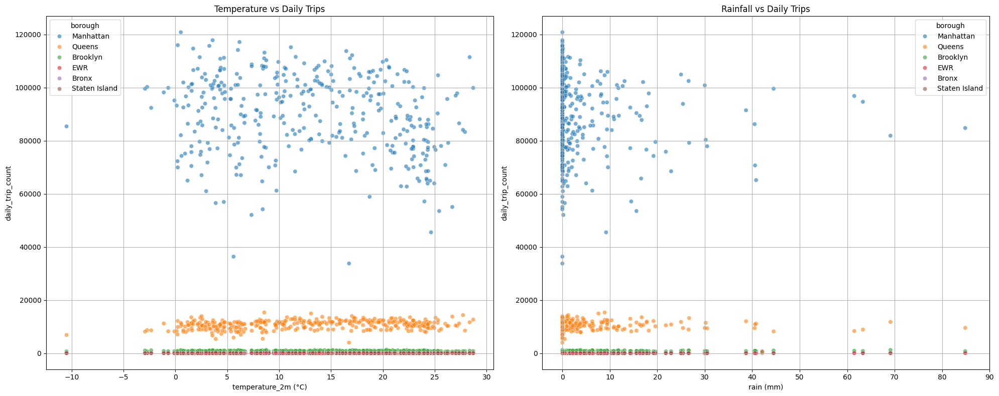

In [ ]:
# Memory optimization function
def reduce_mem_usage(df):
    start_mem = df.memory_usage().sum() / 1024**2
    for col in df.columns:
        col_type = df[col].dtype

        if col_type != object and col_type != 'datetime64[ns]':
            c_min = df[col].min()
            c_max = df[col].max()

            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)

    end_mem = df.memory_usage().sum() / 1024**2
    print(f'Memory usage decreased from {start_mem:.2f} MB to {end_mem:.2f} MB')
    return df

# Load taxi zone shapefile to get borough information
taxi_zones_custom = gpd.read_file('/content/data/taxi_zones.shp')
zone_borough_lookup_custom = taxi_zones_custom[['LocationID', 'borough']].rename(columns={'LocationID': 'PULocationID'})

# Combine yellow and green taxi data more efficiently
necessary_columns_custom = ['pickup_date', 'PULocationID', 'passenger_count', 'total_amount',
                     'trip_distance', 'tip_amount', 'tolls_amount']
df_yellow_custom = df_yellow[necessary_columns_custom]
df_green_custom = df_green[necessary_columns_custom]

df_yg_custom = pd.concat([df_yellow_custom, df_green_custom])
del df_yellow_custom, df_green_custom  # Free up memory

# Optimize memory for combined dataframe
df_yg_custom = reduce_mem_usage(df_yg_custom)

# Convert pickup datetime to date
df_yg_custom['date'] = pd.to_datetime(df_yg_custom['pickup_date']).dt.date
df_yg_custom = df_yg_custom.drop('pickup_date', axis=1)  # Remove redundant column

# Merge taxi data with borough information and aggregate
df_yg_custom = pd.merge(df_yg_custom, zone_borough_lookup_custom, on='PULocationID', how='left')
taxi_daily_borough_custom = df_yg_custom.groupby(['date', 'borough']).agg({
    'passenger_count': 'count',
    'total_amount': 'mean',
    'trip_distance': 'mean',
    'tip_amount': 'mean',
    'tolls_amount': 'mean'
}).reset_index()

del df_yg_custom  # Free up memory

# Optimize aggregated taxi data
taxi_daily_borough_custom = reduce_mem_usage(taxi_daily_borough_custom)

# Rename columns for clarity
taxi_daily_borough_custom.columns = ['date', 'borough', 'daily_trip_count', 'avg_trip_price',
                             'avg_trip_distance', 'avg_tip', 'avg_tolls']

# Load and process weather data efficiently
weather_df_custom = pd.read_csv('/content/data/weather_data.csv', skiprows=2,
                         usecols=['time', 'temperature_2m (°C)', 'rain (mm)', 'snowfall (cm)'])
weather_df_custom['date'] = pd.to_datetime(weather_df_custom['time']).dt.date
weather_df_custom = weather_df_custom.drop('time', axis=1)

weather_daily_custom = weather_df_custom.groupby('date').agg({
    'temperature_2m (°C)': 'mean',
    'rain (mm)': 'sum',
    'snowfall (cm)': 'sum'
}).reset_index()

del weather_df_custom  # Free up memory
weather_daily_custom = reduce_mem_usage(weather_daily_custom)

# Load and process traffic data efficiently
traffic_cols_custom = ['Yr', 'M', 'D', 'Boro', 'Vol']
traffic_df_custom = pd.read_csv('/content/data/Automated_Traffic_Volume_Counts_20241005.csv', usecols=traffic_cols_custom)

# Create date column efficiently
traffic_df_custom['date'] = pd.to_datetime(
    traffic_df_custom['Yr'].astype(str) + '-' +
    traffic_df_custom['M'].astype(str).str.zfill(2) + '-' +
    traffic_df_custom['D'].astype(str).str.zfill(2)
).dt.date

traffic_df_custom = traffic_df_custom.drop(['Yr', 'M', 'D'], axis=1)
traffic_daily_borough_custom = traffic_df_custom.groupby(['date', 'Boro']).agg({
    'Vol': 'sum'
}).reset_index()

del traffic_df_custom  # Free up memory
traffic_daily_borough_custom = reduce_mem_usage(traffic_daily_borough_custom)

# Merge datasets efficiently
print("Merging datasets...")
merged_df_custom = pd.merge(taxi_daily_borough_custom, weather_daily_custom, on='date', how='outer')
final_df_custom = pd.merge(merged_df_custom, traffic_daily_borough_custom,
                    left_on=['date', 'borough'],
                    right_on=['date', 'Boro'],
                    how='outer')

del merged_df_custom, taxi_daily_borough_custom, weather_daily_custom, traffic_daily_borough_custom  # Free up memory
final_df_custom = reduce_mem_usage(final_df_custom)

# Weather Impact Analysis
def plot_weather_impact_custom(final_df_custom):
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))

    # Temperature vs Daily Trips
    sns.scatterplot(data=final_df_custom, x='temperature_2m (°C)', y='daily_trip_count',
                    hue='borough', ax=axes[0], alpha=0.6)
    axes[0].set_title('Temperature vs Daily Trips')
    axes[0].grid(True)

    # Rainfall vs Daily Trips
    sns.scatterplot(data=final_df_custom, x='rain (mm)', y='daily_trip_count',
                    hue='borough', ax=axes[1], alpha=0.6)
    axes[1].set_title('Rainfall vs Daily Trips')
    axes[1].set_xticks(range(0, int(final_df_custom['rain (mm)'].max()) + 10, 10))
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()

print("\nWeather Impact Analysis")
plot_weather_impact_custom(final_df_custom)


**Summary:**

**Temperature vs. Daily Trips**: The first plot indicates that the ideal temperature range for taxi trips is between -3°C to 28°C. Within this range, there is a random scatter of trip counts, suggesting that while temperature affects taxi demand, other factors may also influence trip frequency.

**Rainfall vs. Daily Trips**: The second plot reveals a significant drop in daily trips observed when rainfall exceeds 20 mm. This trend indicates that high levels of rain discourage taxi usage, which is critical information for stakeholders looking to manage fleet availability and operational strategies during inclement weather.

### Revenue Generation Insights



---



---



**Question**: Identifying the peak hours for revenue generation.


---



In [ ]:
# Extract the hour from the pickup time
df_yellow['pickup_hour'] = pd.to_datetime(df_yellow['pickup_time'], format='%H:%M:%S').dt.hour

# Group by the hour of the day and sum the total amount for each hour
total_fare_by_hour_yellow = df_yellow.groupby('pickup_hour')['total_amount'].sum()
total_fare_all_day_yellow = total_fare_by_hour_yellow.sum()

# Get ratio
total_fare_by_hour_yellow_ratio = (total_fare_by_hour_yellow / total_fare_all_day_yellow) * 100

# Total count of trips per hour
total_trips_yellow = df_yellow.groupby('pickup_hour').size()

# Calculate average fare per trip per hour
average_fare_yellow = total_fare_by_hour_yellow / total_trips_yellow

# Save result to a data frame with average fare
result_yellow_df = pd.DataFrame({
    'total_fare': total_fare_by_hour_yellow,
    'fare_ratio': total_fare_by_hour_yellow_ratio,
    'average_fare': average_fare_yellow,
    'total_trips': total_trips_yellow # Added average fare
})

# Format the index to represent hour ranges (e.g., "0-1", "1-2")
result_yellow_df.index = result_yellow_df.index.map(lambda x: f"{x}-{x+1}")

print("Pickup Hour Insight: Yellow Taxi")
print(result_yellow_df)

# Extract the hour from the pickup time
df_green['pickup_hour'] = pd.to_datetime(df_green['pickup_time'], format='%H:%M:%S').dt.hour

# Group by the hour of the day and sum the total amount for each hour
total_fare_by_hour_green = df_green.groupby('pickup_hour')['total_amount'].sum()
total_fare_all_day_green = total_fare_by_hour_green.sum()

# Get ratio
total_fare_by_hour_green_ratio = (total_fare_by_hour_green / total_fare_all_day_green) * 100

# Total count of trips per hour
total_trips_green = df_green.groupby('pickup_hour').size()

# Calculate average fare per trip per hour
average_fare_green = total_fare_by_hour_green / total_trips_green

# Save result to a data frame with average fare
result_green_df = pd.DataFrame({
    'total_fare': total_fare_by_hour_green,
    'fare_ratio': total_fare_by_hour_green_ratio,
    'average_fare': average_fare_green,
    'total_trips': total_trips_green,# Added average fare
})

# Format the index to represent hour ranges (e.g., "0-1", "1-2")
result_green_df.index = result_green_df.index.map(lambda x: f"{x}-{x+1}")

print("\nPickup Hour Insight: Green Taxi")
print(result_green_df)

Pickup Hour Insight: Yellow Taxi
              total_fare  fare_ratio  average_fare  total_trips
pickup_hour                                                    
0-1          29424861.00    2.838554     28.719958      1024544
1-2          18008544.27    1.737246     26.173041       688057
2-3          11175650.48    1.078091     24.658008       453226
3-4           7643112.27    0.737315     25.732652       297020
4-5           6301796.81    0.607921     32.622893       193171
5-6           7801544.17    0.752598     38.025151       205168
6-7          15524915.72    1.497656     31.650946       490504
7-8          26585486.66    2.564646     27.476807       967561
8-9          35648474.01    3.438933     26.449458      1347796
9-10         41232659.86    3.977627     26.659610      1546634
10-11        45684063.36    4.407045     26.940456      1695742
11-12        49942764.91    4.817873     27.091613      1843477
12-13        54990890.23    5.304855     27.481965      2000981
13-14  

**Summary:** Both Yellow and Green taxis generate the highest total fares and handle the most trips during 4 PM to 7 PM. Additionally, their average fare per trip peaks early in the morning between 5 AM and 6 AM.

This pattern shows that taxi demand is concentrated during peak late afternoon times, likely due to people returning home from work and that taxi services charge passengers more during the early morning hours.

**Question**: How do customer demand patterns shift in response to fare increases for yellow taxis?

---



                            OLS Regression Results                            
Dep. Variable:         log_trip_count   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.304
Method:                 Least Squares   F-statistic:                     26.74
Date:                Tue, 15 Oct 2024   Prob (F-statistic):           3.01e-06
Time:                        19:36:21   Log-Likelihood:                 196.86
No. Observations:                  60   AIC:                            -389.7
Df Residuals:                      58   BIC:                            -385.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     15

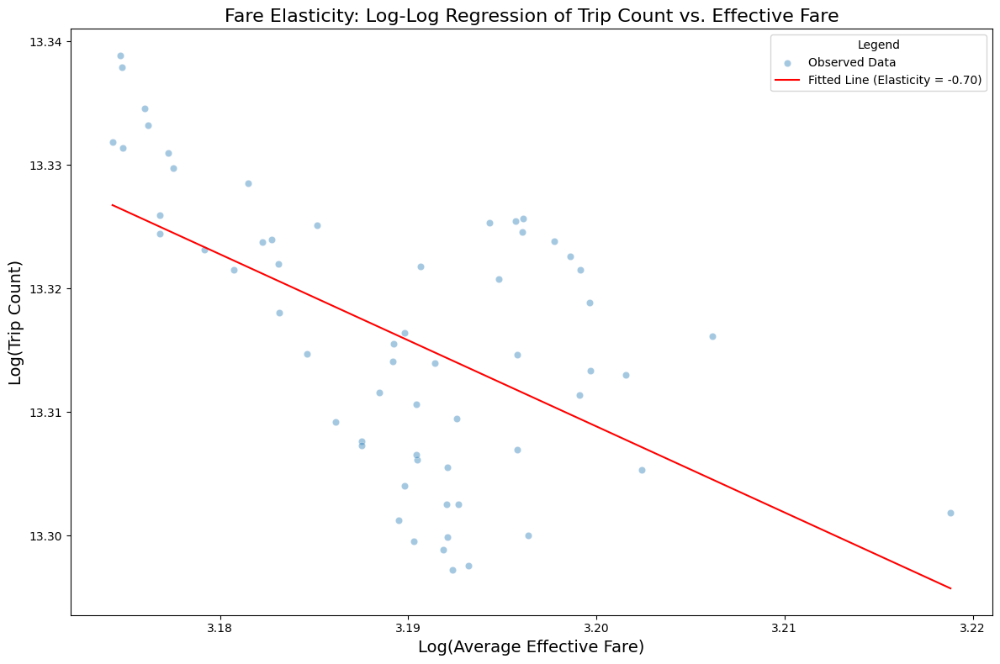

In [ ]:
# Visualizing Fare elasticity in response to surge pricing and congestion surcharge
# Calculate Effective Fare
df_yellow['effective_fare'] = (df_yellow['fare_amount'] + df_yellow['total_surcharge'])

# Convert 'pickup_time' to datetime object and create 'pickup_hour'
df_yellow['pickup_time_dt'] = pd.to_datetime(df_yellow['pickup_time'], format='%H:%M:%S', errors='coerce')
df_yellow['pickup_minute'] = df_yellow['pickup_time_dt'].dt.minute

# Aggregate data by 'pickup_minute'
agg_df = df_yellow.groupby('pickup_minute').agg(trip_count=('trip_distance', 'count'), avg_effective_fare=('effective_fare', 'mean'), avg_trip_distance=('trip_distance', 'mean')).reset_index()

# Remove any records with non-positive fares or trip counts to avoid log issues
agg_df = agg_df[(agg_df['avg_effective_fare'] > 0) & (agg_df['trip_count'] > 0)]

# Apply logarithmic transformation
agg_df['log_trip_count'] = np.log(agg_df['trip_count'])
agg_df['log_avg_effective_fare'] = np.log(agg_df['avg_effective_fare'])

# Model Fitting

# Define the dependent and independent variables
X = agg_df['log_avg_effective_fare']
X = sm.add_constant(X)  # Adds a constant term to the predictor
y = agg_df['log_trip_count']

# Fit the Ordinary Least Squares (OLS) regression model
model = sm.OLS(y, X).fit()

# Print the regression summary
print(model.summary())

# Extract the elasticity coefficient (slope)
elasticity = model.params['log_avg_effective_fare']

# Visualization

plt.figure(figsize=(12, 8))

# Scatter plot of log-transformed data
sns.scatterplot(x='log_avg_effective_fare', y='log_trip_count', data=agg_df, label='Observed Data', alpha=0.4)

# Plot the regression line
sns.lineplot(x=agg_df['log_avg_effective_fare'], y=model.predict(X), color='red', label=f'Fitted Line (Elasticity = {elasticity:.2f})')

# Set axis labels and title
plt.xlabel('Log(Average Effective Fare)', fontsize=14)
plt.ylabel('Log(Trip Count)', fontsize=14)
plt.title('Fare Elasticity: Log-Log Regression of Trip Count vs. Effective Fare', fontsize=16)

# Display legend
plt.legend(title='Legend')

# Show plot
plt.tight_layout()
plt.show()



**Summary**: By conducting a log-log regression, we have quantified how trip demand responds to fare changes, offering actionable insights for fare strategy. The regression results reveal that the relationship between trip count and effective fare is statistically significant, with p-values below 0.05, confirming the reliability of the findings. While the R-squared value is 0.316, which indicates that around 31% of the variability in trip count is explained by fare changes, this level is reasonable for a model with a single explanatory variable.

The key finding is the elasticity of trip demand, measured at -0.70. This means that for every 1% increase in effective fare (due to surge pricing or congestion surcharges), trip demand decreases by 0.7%. Although demand is somewhat inelastic, the negative coefficient shows that customers are price-sensitive, but not overwhelmingly so.

This suggests that moderate fare increases can help boost revenue without causing a proportionate loss in demand. However, fare hikes must be carefully balanced to avoid significant reductions in ridership, as even small increases have a measurable impact on trip volumes.

**Question**: How does surcharge contribute to average revenue at different hours of the day, and what patterns emerge?

---

<ipython-input-26-cf0107f56b06>:8: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  df_yg['pickup_timedelta'] = pd.to_timedelta(df_yg['pickup_time'].apply(lambda x: x.hour*3600 + x.minute*60 + x.second, 1), unit='s')
<ipython-input-26-cf0107f56b06>:9: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  df_yg['dropoff_timedelta'] = pd.to_timedelta(df_yg['dropoff_time'].apply(lambda x: x.hour*3600 + x.minute*60 + x.second, 1), unit='s')


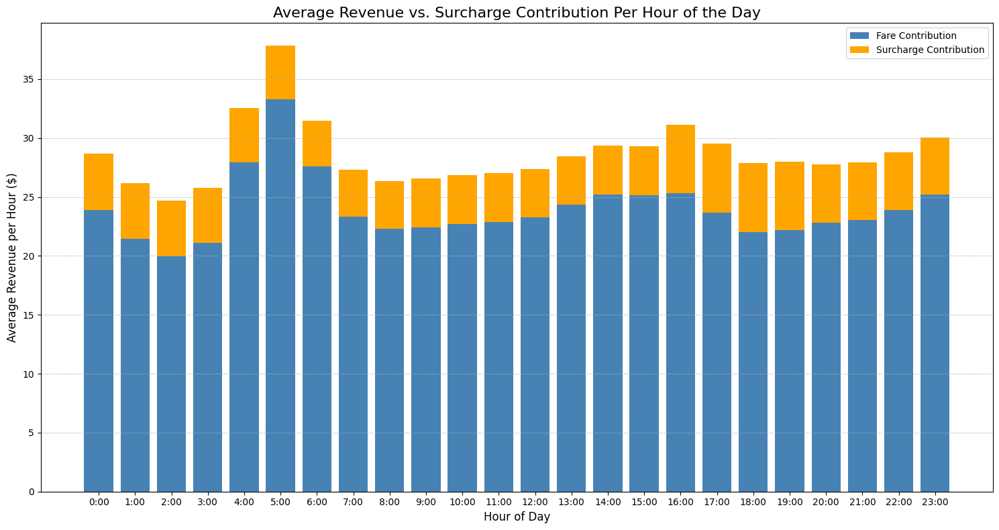

In [ ]:
# Average Revenue vs. Surcharge Contribution Per Hour of the Day for concatenated dataframe of green and yellow taxis

# Converting 'pickup_date' and 'dropoff_date' to datetime if they are still objects
df_yg['pickup_date'] = pd.to_datetime(df_yg['pickup_date'], errors='coerce')
df_yg['dropoff_date'] = pd.to_datetime(df_yg['dropoff_date'], errors='coerce')

# Manually creating a timedelta from the 'pickup_time' and 'dropoff_time' columns, assuming they are datetime.time objects
df_yg['pickup_timedelta'] = pd.to_timedelta(df_yg['pickup_time'].apply(lambda x: x.hour*3600 + x.minute*60 + x.second, 1), unit='s')
df_yg['dropoff_timedelta'] = pd.to_timedelta(df_yg['dropoff_time'].apply(lambda x: x.hour*3600 + x.minute*60 + x.second, 1), unit='s')

# Combining 'pickup_date' and 'pickup_timedelta' into 'pickup_datetime'
df_yg['pickup_datetime'] = df_yg['pickup_date'] + df_yg['pickup_timedelta']

# Combining 'dropoff_date' and 'dropoff_timedelta' into 'dropoff_datetime'
df_yg['dropoff_datetime'] = df_yg['dropoff_date'] + df_yg['dropoff_timedelta']

# Extracting 'pickup_hour' from 'pickup_datetime'
df_yg['pickup_hour'] = df_yg['pickup_datetime'].dt.hour

# Group by the hour of the day and calculate the average fare and average surcharge for each hour
hourly_revenue = df_yg.groupby('pickup_hour').agg(
    total_revenue=('total_amount', 'sum'),
    total_surcharge=('total_surcharge', 'sum'),
    trip_count=('pickup_hour', 'count')  # Count the number of trips for each hour
).reset_index()

# Calculate the average revenue and average surcharge per hour
hourly_revenue['avg_revenue'] = hourly_revenue['total_revenue'] / hourly_revenue['trip_count']
hourly_revenue['avg_surcharge'] = hourly_revenue['total_surcharge'] / hourly_revenue['trip_count']

# Calculate the average fare contribution (average revenue minus surcharges)
hourly_revenue['avg_fare_contribution'] = hourly_revenue['avg_revenue'] - hourly_revenue['avg_surcharge']

# Plotting the stacked bar chart
plt.figure(figsize=(15, 8))

# Plot fare contribution as the bottom stack and surcharge as the top stack
plt.bar(hourly_revenue['pickup_hour'], hourly_revenue['avg_fare_contribution'], label='Fare Contribution', color='steelblue')
plt.bar(hourly_revenue['pickup_hour'], hourly_revenue['avg_surcharge'], bottom=hourly_revenue['avg_fare_contribution'],
        label='Surcharge Contribution', color='orange')

# Adding labels and title
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('Average Revenue per Hour ($)', fontsize=12)
plt.title('Average Revenue vs. Surcharge Contribution Per Hour of the Day', fontsize=16)
plt.xticks(ticks=range(0, 24), labels=[f'{i}:00' for i in range(24)])

# Adding a grid
plt.grid(True, which='both', axis='y', linestyle='--', linewidth=0.5)

# Display legend
plt.legend()

# Show plot
plt.tight_layout()
plt.show()


**Summary**: This chart reveals crucial insights into how surcharge contributes to average revenue throughout the day. Key takeaways include:

1. Maximized Revenue in Early Hours: The highest revenue per trip occurs between 5:00 and 6:00 AM, driven heavily by surcharges. This is a clear opportunity to capitalize on early morning demand.

2. Significant Surcharge Impact: Surcharges make a noticeable contribution during the late-night and early-morning hours, indicating that these times are especially lucrative for the business.

3. Evening Surge: Revenue increases again between 8:00–10:00 PM, suggesting another window of high profitability, though slightly lower than the morning peak.

4. Afternoon Slump: The mid-afternoon (1:00–4:00 PM) sees the lowest revenue, with both fare and surcharge contributions dipping, signaling an opportunity to re-engage passengers during these hours.

These insights suggest focusing efforts on peak times to maximize profitability while considering strategies to uplift revenue during slower periods, such as targeted promotions or optimizing fleet distribution.


**Question**: How does surcharge contribute to total revenue across different times of the day, and what significant patterns can we identify?


---



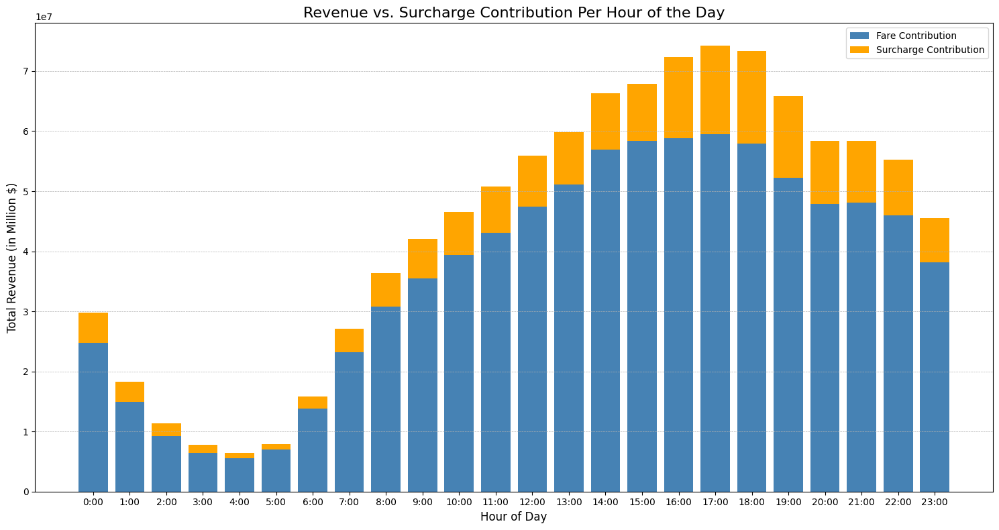

In [ ]:

# Group by the hour of the day and calculate the total fare and total surcharge for each hour
hourly_revenue = df_yg.groupby('pickup_hour').agg(
    total_revenue=('total_amount', 'sum'),
    total_surcharge=('total_surcharge', 'sum')
).reset_index()

# Calculate the fare contribution (total revenue minus surcharges)
hourly_revenue['fare_contribution'] = hourly_revenue['total_revenue'] - hourly_revenue['total_surcharge']

# Plotting the stacked bar chart
plt.figure(figsize=(15, 8))

# Plot fare contribution as the bottom stack and surcharge as the top stack
plt.bar(hourly_revenue['pickup_hour'], hourly_revenue['fare_contribution'], label='Fare Contribution', color='steelblue')
plt.bar(hourly_revenue['pickup_hour'], hourly_revenue['total_surcharge'], bottom=hourly_revenue['fare_contribution'],
        label='Surcharge Contribution', color='orange')

# Adding labels and title
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('Total Revenue (in Ten Million $)', fontsize=12)
plt.title('Revenue vs. Surcharge Contribution Per Hour of the Day', fontsize=16)
plt.xticks(ticks=range(0, 24), labels=[f'{i}:00' for i in range(24)])

# Adding a grid
plt.grid(True, which='both', axis='y', linestyle='--', linewidth=0.5)

# Display legend
plt.legend()

# Show plot
plt.tight_layout()
plt.show()


**Summary**: This chart provides an in-depth view of total revenue generated per hour, broken down by fare contributions and surcharge contributions. Key insights from the chart include:

1. Revenue Peaks in Late Afternoon: The total revenue surges to its highest point between 5:00 and 6:00 PM, driven by a substantial combination of fare and surcharge contributions, making this period the most lucrative for the business.

2. Morning Revenue Growth: From 6:00 AM onwards, there is a steady and significant increase in revenue, with a notable contribution from surcharges, reaching a peak just before noon. This morning growth highlights a critical window for maximizing earnings.

3. Late Night Revenue: Although revenue dips significantly after midnight, there’s still a considerable surcharge contribution during these hours, indicating that late-night trips remain valuable due to added surcharges.

4. Midday Opportunity: The hours between 11:00 AM and 4:00 PM maintain a high level of revenue, suggesting a consistent demand, though surcharge contributions remain stable. This period offers potential for further optimization in pricing strategies.

5. Early Morning Lull: From 3:00 to 5:00 AM, both fare and surcharge contributions are at their lowest, representing the least profitable time of day. This period could benefit from targeted strategies to attract passengers or streamline operations.

These insights provide clear patterns that can guide fleet management and pricing strategies, ensuring that the business maximizes revenue during peak times while addressing lower-performing periods with tailored interventions.

**Question**: How do tips vary based on distance, and do rides with higher passenger counts tip more?


---



Final DataFrame with tip-to-total ratio:
               average_tip  average_total  tip_to_total_ratio
trip_category                                                
short             2.173284      16.878458           12.876082
medium            3.519956      27.226810           12.928271
long              8.062550      67.028617           12.028519


<Figure size 4000x1500 with 0 Axes>

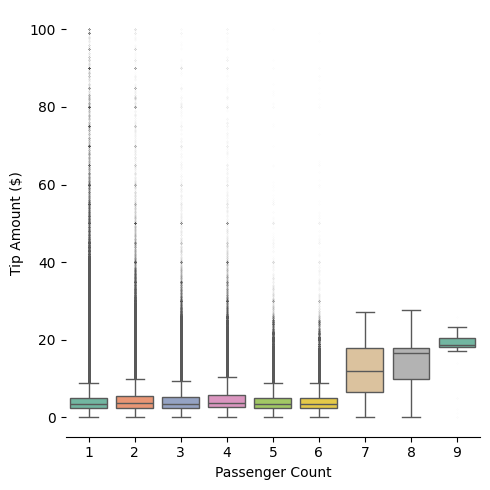

In [ ]:
# Create trip distance categories: short (< 2 miles), medium (2-5 miles), long (> 5 miles)
df_yellow['trip_category'] = pd.cut(df_yellow['trip_distance'],
                                    bins=[0, 2, 5, float('inf')],
                                    labels=['short', 'medium', 'long'])

# Group by trip category and calculate the average tip amount
average_tip_by_trip_category = df_yellow.groupby('trip_category')['tip_amount'].mean()

# Group by trip category and calculate the average total amount
average_total_by_trip_category = df_yellow.groupby('trip_category')['total_amount'].mean()

# save result
result_df = pd.DataFrame({
    'average_tip': average_tip_by_trip_category,
    'average_total': average_total_by_trip_category
})

# get ratio
result_df['tip_to_total_ratio'] = result_df['average_tip'] / result_df['average_total'] * 100

# show
print("Final DataFrame with tip-to-total ratio:")
print(result_df)

# Tip Amount Distribution by Passenger Count

# Creating the box plot using seaborn's catplot
plt.figure(figsize=(40, 15))
tips_df = df_yellow[(df_yellow['tip_amount'] > 0) & (df_yellow['tip_amount'] < 100)]
tip_box = sns.catplot(data=tips_df,x='passenger_count', y='tip_amount',kind='box', hue='passenger_count', palette='Set2', fliersize = 0.01, legend = False)

# Customize the plot
tip_box.set_axis_labels("Passenger Count", "Tip Amount ($)").set_titles("Tip Amount Distribution by Passenger Count")
tip_box.despine(left=True)  # Remove the left spine for a cleaner look

# Show plot
plt.tight_layout()
plt.show()

**Summary**: This analysis reveals that while the average tip and total fare vary across different trip distances, the tip-to-total fare ratio remains consistent across all distance ranges.

The box plot highlights that tip distribution is steady for passenger counts of 1-6, but the median tip amount significantly increases for rides with 7-9 passengers. Interestingly, trips with a single passenger show the most variability, with the highest number of outliers, including those with the largest tip amounts. This suggests that larger groups tend to tip more consistently, while solo riders contribute more unpredictably, sometimes tipping exceptionally high.




**Question:** What is the relationship between average fare and tips given in different boroughs for taxi trips?


---




Plotting Average Fare vs Tip Given


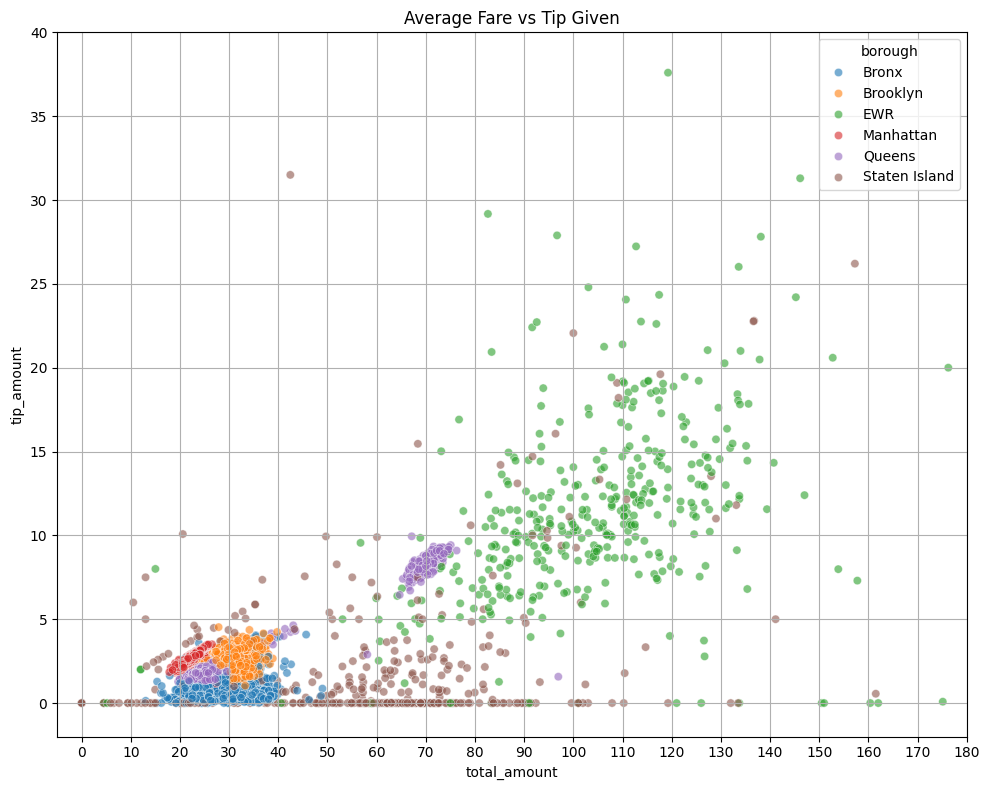

In [ ]:

# Scatter plot for average fare vs. tip given
def plot_fare_vs_tip(merged_df):
    plt.figure(figsize=(10, 8))
    sns.scatterplot(data=merged_df, x='total_amount', y='tip_amount', hue='borough', alpha=0.6)
    plt.title('Average Fare vs Tip Given')

    # Set x-axis and y-axis limits
    plt.xlim(-5, 180)
    plt.ylim(-2, 40)

    # Set x-axis and y-axis ticks in steps
    plt.xticks(range(0, 181, 10))
    plt.yticks(range(0, 41, 5))

    plt.grid(True)
    plt.tight_layout()
    plt.show()

print("\nPlotting Average Fare vs Tip Given")
plot_fare_vs_tip(merged_df)


**Summary**

**Clustered Tips in Manhattan, Brooklyn, and the Bronx**: The plot reveals that tips in these boroughs are predominantly clustered below $5. This suggests that passengers in these areas tend to give smaller tips relative to the fare amount, indicating a potential need for improved service quality or passenger satisfaction.

**Higher Variance in Newark (EWR)**: In contrast, Newark shows a notable trend of longer trips, which correlates with larger tips. The increased variance in tip amounts indicates that while some passengers are tipping generously for longer trips, others may not, highlighting an opportunity for targeted marketing or service enhancements to increase tip averages.





**Question**: How do customer tipping patterns for green and yellow taxis evolve over a year, and what trends can be identified?

---

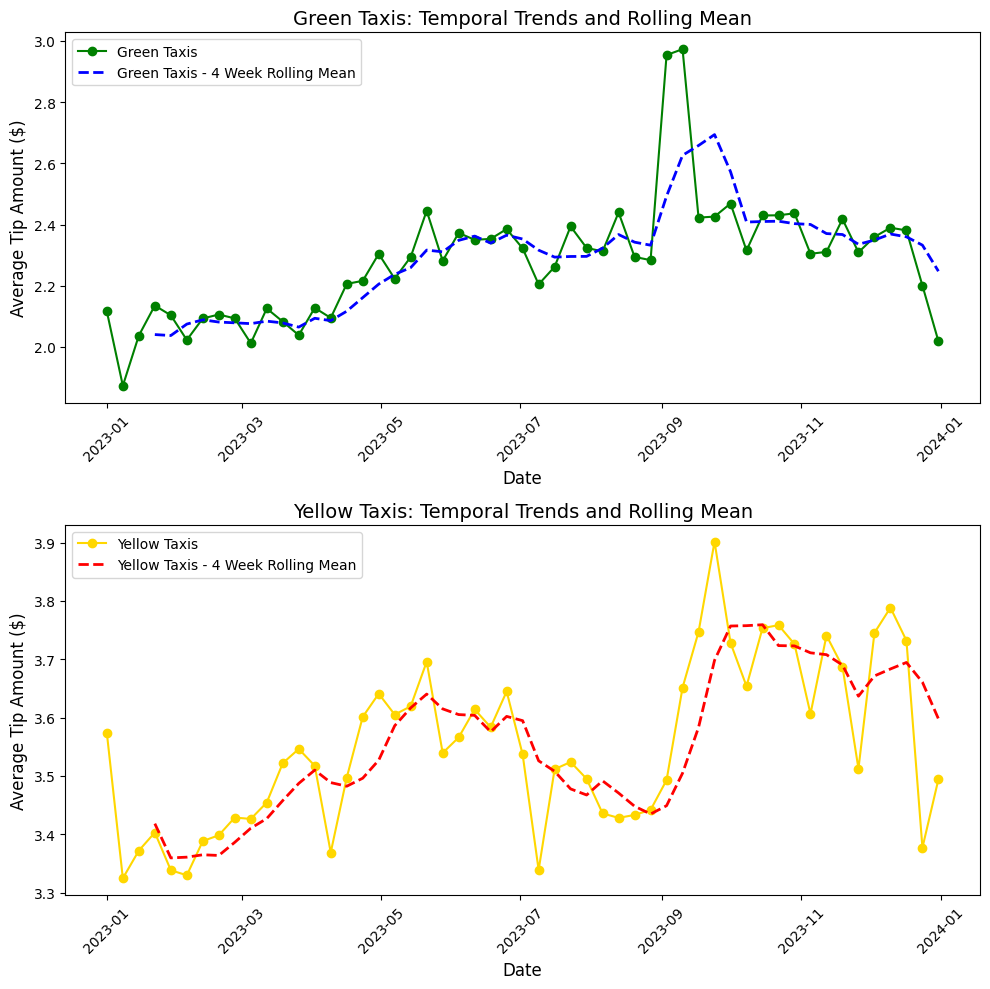

In [ ]:
# Convert 'pickup_date' to datetime format if it's not already for both datasets
df_green['pickup_date'] = pd.to_datetime(df_green['pickup_date'], errors='coerce')
df_yellow['pickup_date'] = pd.to_datetime(df_yellow['pickup_date'], errors='coerce')

# Filter data for the year 2023 only
df_green_2023 = df_green[df_green['pickup_date'].dt.year == 2023]
df_yellow_2023 = df_yellow[df_yellow['pickup_date'].dt.year == 2023]

# Resample the data to calculate the average tip amount by week for green taxis
tip_trends_2023_green = df_green_2023.resample('W', on='pickup_date').agg(
    avg_tip_amount=('tip_amount', 'mean')
).reset_index()

# Calculate the rolling mean for green taxis (4-week window)
tip_trends_2023_green['rolling_mean'] = tip_trends_2023_green['avg_tip_amount'].rolling(window=4).mean()

# Resample the data to calculate the average tip amount by week for yellow taxis
tip_trends_2023_yellow = df_yellow_2023.resample('W', on='pickup_date').agg(
    avg_tip_amount=('tip_amount', 'mean')
).reset_index()

# Calculate the rolling mean for yellow taxis (4-week window)
tip_trends_2023_yellow['rolling_mean'] = tip_trends_2023_yellow['avg_tip_amount'].rolling(window=4).mean()

# Create a figure with two subplots, one on top of the other (2 rows, 1 column)
plt.figure(figsize=(10, 10))

# Subplot 1: Green Taxis
plt.subplot(2, 1, 1)
plt.plot(tip_trends_2023_green['pickup_date'], tip_trends_2023_green['avg_tip_amount'],
         marker='o', linestyle='-', color='green', label='Green Taxis')
plt.plot(tip_trends_2023_green['pickup_date'], tip_trends_2023_green['rolling_mean'],
         linestyle='--', color='blue', label='Green Taxis - 4 Week Rolling Mean', linewidth=2)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Average Tip Amount ($)', fontsize=12)
plt.title('Green Taxis: Temporal Trends and Rolling Mean', fontsize=14)
plt.legend()
plt.xticks(rotation=45)

# Subplot 2: Yellow Taxis
plt.subplot(2, 1, 2)
plt.plot(tip_trends_2023_yellow['pickup_date'], tip_trends_2023_yellow['avg_tip_amount'],
         marker='o', linestyle='-', color='gold', label='Yellow Taxis')
plt.plot(tip_trends_2023_yellow['pickup_date'], tip_trends_2023_yellow['rolling_mean'],
         linestyle='--', color='red', label='Yellow Taxis - 4 Week Rolling Mean', linewidth=2)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Average Tip Amount ($)', fontsize=12)
plt.title('Yellow Taxis: Temporal Trends and Rolling Mean', fontsize=14)
plt.legend()
plt.xticks(rotation=45)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


**Summary**: This visualization tracks the temporal trends in average tip amounts for both green and yellow taxis, along with their 4-week rolling averages. Several key insights emerge:

1. Seasonal Patterns: Both green and yellow taxis show clear fluctuations in average tip amounts throughout the year, with notable peaks in the summer months (around July-September) and significant drops toward the end of the year.

2. Higher Tip Variability for Yellow Taxis: Yellow taxis exhibit more volatile tipping behavior, with sharp increases and decreases in tip amounts compared to the more gradual trends observed for green taxis. This could indicate different customer demographics or ride patterns between the two services.

3. Sustained Growth in Tips for Green Taxis: The green taxis show a gradual upward trend in tips through the middle of the year, peaking around September before experiencing a sharp drop.

4. End-of-Year Dip: Both taxi services experience a noticeable decline in average tip amounts toward the end of the year. This may reflect a shift in ride demand during the holiday season.

Understanding these trends will allow the business to optimize customer engagement strategies during peak and low tipping periods, potentially introducing targeted promotions to boost customer satisfaction and tips during downturns.

### EDA Summary



---

The visualizations provide key insights into New York City taxi trip patterns and fare dynamics. One significant finding is the Pickup to Drop-off Ratio by Location, which highlights zones where pickups vastly outnumber drop-offs. High ratios in certain areas, such as near transit hubs and residential neighborhoods, reveal optimal zones for drivers to target for more pickups. This insight helps inform driver strategies for maximizing efficiency and reducing downtime between trips. The Trip Distance Distribution chart shows that the majority of taxi trips, for both yellow and green taxis, are short-distance trips (0-2 miles). Yellow taxis dominate in shorter trips, with the highest trip volume occurring around 1 mile, suggesting strong demand for short rides, particularly for yellow taxis. In addition, the average trip duration and trip count chart shows that trip duration is highest in the early morning, while the trip count peaks during the afternoon.

The tip amount distribution remains stable across passenger counts 1-6 and median tip increases for bigger taxis (passenger count 7-9), possibly due to higher fare. Also notice that single-passenger trips exhibit greater variability, suggesting inconsistent tipping behavior. Furthermore, the log-log regression model shows that trip demand is moderately elastic, with a 1% increase in effective fare leading to a 0.69% decrease in trip count. The weather analysis reveals that both temperature and rainfall slightly affect ride demand. Higher temperatures (10°C-25°C) and rainy conditions increase taxi trips, particularly in central boroughs like Manhattan.
Lastly, the peak pickup times align with expected demand surges during morning and evening rush hours, reinforcing the need for strategic pricing during high-traffic periods.
The correlation matrix shows that fare amount and total amount are highly correlated (1.00).

Collectively, these insights provide a comprehensive understanding of passenger behavior, fare dynamics, and optimal times and locations for drivers to improve their earnings and efficiency.

## Conclusion


---



---


Based on the comprehensive data analysis of New York City Taxi and Limousine Commission (TLC) trips in 2023, we present a concluding summary aligned with the three subsets of Exploratory Data Analysis:


**Customer Pattern Analysis - Key Findings:**


---


- Single Passenger Dominance: Most trips are made by individual passengers, especially during peak hours (2 PM - 6 PM). These rides are primarily concentrated in key urban areas such as Midtown Manhattan and other business hubs.
- Temporal Trends: The afternoon hours (2 PM - 6 PM) experience the highest trip counts, while early morning hours see longer average trip durations, likely due to commuter behavior.
- Payment Preferences: Credit card payments dominate all taxis, with 80.7% of yellow taxi rides and 65.9% of green taxi rides being paid via credit card. Higher tips are also associated with credit card payments, suggesting a preference for convenient, cashless payment options.

*Recommendations:*
- Fleet Availability During Peak Hours: Dynamic adjustments to fleet distribution should be made to ensure an adequate supply of taxis, particularly during peak times and in high-demand locations, improving customer satisfaction by reducing wait times.
- Shared Ride Services: Introducing shared ride services for single-passenger trips during peak periods can increase vehicle occupancy, reduce passenger costs, and improve fleet efficiency.
- Promote Cashless Transactions: Incentivize cashless payment options to not only streamline operations but also capitalize on higher tipping trends, potentially boosting overall profitability.

**Resource Allocation Optimization Insights - Key Findings:**


---


- High-Volume Zones: Areas like airports and central business districts have emerged as critical zones with high pickup-to-dropoff ratios, especially during rush hours.
- Geographical Variability: Demand for taxis varies significantly across different boroughs. For instance, Manhattan consistently shows high trip counts, while areas such as Queens and Brooklyn exhibit variability based on specific locations and times of the day.

*Recommendations:*
- Targeted Fleet Allocation: Allocate additional taxis to high-demand zones such as airports, Midtown Manhattan, and other key areas during peak hours to ensure optimal ride availability.
- Dynamic Zone Prioritization: Develop a dynamic allocation strategy that adapts to real-time data, ensuring the right resources are placed in the right areas based on immediate demand patterns. For example, since traffic on Sundays seems to concentrated at JFK airport, the resources can be targeted to that zone.

**Revenue Generation Insights - Key Findings:**


---


- Fare Dynamics and Trip Length: Shorter trips (under 2 miles) dominate in number, but longer trips contribute disproportionately to the total fare revenue. The elasticity analysis of fare rates revealed that a 1% fare increase led to a 0.7% decrease in ridership.
- Surcharge vs. Revenue Analysis: Trips involving surcharges, such as airport pickups or peak demand periods, contribute significantly to overall revenue, indicating their effectiveness as a strategic tool for maximizing profitability.
- Tip amounts show significant temporal variation, with peaks in the summer months and declines at the end of the year, indicating that seasonal factors strongly influence tipping behavior across both green and yellow taxis.

*Recommendations:*
- Adaptive Pricing: Implement moderate fare adjustments during high-demand periods to boost revenue without significantly reducing ridership. A dynamic pricing model that reflects real-time demand changes could help optimize pricing efficiency.
- Incentives for Long-Distance Trips: Encouraging longer trips through loyalty programs, discounts, or partnerships with local hotels and attractions could increase both trip frequency and revenue generated through tips, and fares.
- Strategic Surcharge Implementation: Introduce or adjust surcharges for high-demand locations, particularly during peak hours. By carefully timing and targeting these surcharges, taxi services can boost overall revenue while managing supply and demand effectively.

This detailed analysis of customer behavior, resource allocation, and revenue dynamics provides a strong foundation for enhancing the operational efficiency of NYC's taxi services. By focusing on customer needs, optimizing fleet distribution, and implementing strategic pricing, the city's taxi services can become more efficient and responsive. Future work could incorporate external factors, such as real-time traffic, weather conditions, or public events, to further refine these insights and develop even more targeted service improvements.


## Challenges


---


---

Throughout the course of this project, we faced several significant challenges that impacted our data processing and analysis. These challenges are outlined below:
- **Large Dataset Size and Slow Processing Times:** The primary challenge was handling the enormous size of the taxi trip datasets. Both the yellow and green taxi data consisted of millions of records, which made data loading, cleaning, and processing extremely time-consuming. Operations such as grouping, merging, and plotting required substantial computational resources and led to prolonged execution times. This limitation hindered our ability to iterate quickly and test different analysis approaches within our project timeline.
- **Limitations of Google Colab for Collaboration:** We utilized Google Colab as our development environment due to its accessibility and built-in support for Python and data science libraries. However, Colab is designed primarily for single-user sessions, which posed challenges for team collaboration. Only one person could actively interact with the notebook at a time, making it difficult to work concurrently on different aspects of the project. This limitation slowed down our collaborative efforts and required additional coordination to merge individual contributions.
- **Parsing Challenges and Inconsistencies in Date Formats:** One of the key issues encountered was that the datetime columns were difficult to parse, which slowed down the data processing pipeline. Additionally, it was observed that some of the dates in the datasets did not belong to the year 2023. This required an additional layer of data validation and cleaning to ensure that all dates were correctly aligned for our analysis.



## References


---



---


*   Python Date-Time Documentation: https://docs.python.org/3/library/datetime.html#strftime-strptime-behavior
*   Statsmodels Documentation: https://www.statsmodels.org/stable/index.html
*   Geopandas Documentation: https://geopandas.org/en/stable/docs.html
*   Shapely Geometry Documentation:  https://shapely.readthedocs.io/en/stable/geometry.html
*   Seaborn Documentation: https://seaborn.pydata.org/
*   Matplotlib Documentation: https://matplotlib.org/stable/api/pyplot_summary.html
*   Tabulate Documentation: https://pypi.org/project/tabulate/
*   Bokeh Documentation: https://bokeh.org/
*   Json Documentation: https://docs.python.org/3/library/json.html













## Generative AI Disclosure:


---



---



Throughout the completion of this project, we utilized Generative AI tools to enhance various aspects of our work. Below is a summary of how these tools contributed:



*   **Content Generation and Grammar Check:** We employed ChatGPT  to assist in brainstorming ideas and structuring the project's initial outline. The AI provided suggestions for refining our thesis statement and identifying key points for each section. We utilised Grammarly to check for any grammatical mistakes.
* **Coding Assistance:** We utilized the open-source AI model Claude to help translate process algorithms into Python code efficiently.
*   **Code Review and Debugging:** Tools such as GitHub Copilot and ChatGPT were utilized to improve our Python code. They provided insights on algorithm optimization and helped resolve potential errors.


All AI-generated content has been thoroughly reviewed, edited, and validated by our team to ensure it meets academic integrity standards and maintains originality and relevance.
